# Comp1-传统组学

主要适配于传统组学的建模和刻画。典型的应用场景探究rad_score最最终临床诊断的作用。

数据的一般形式为(具体文件,文件夹名可以不同)：
1. `images`文件夹，存放研究对象所有的CT、MRI等数据。
2. `masks`文件夹, 存放手工（Manuelly）勾画的ROI区域。与images文件夹的文件意义对应。
3. `label.txt`文件，每个患者对应的标签，例如肿瘤的良恶性、5年存活状态等。

## Onekey步骤

1. 数据校验，检查数据格式是否正确。
2. 组学特征提取，如果第一步检查数据通过，则提取对应数据的特征。
3. 读取标注数据信息。
4. 特征与标注数据拼接。形成数据集。
5. 查看一些统计信息，检查数据时候存在异常点。
6. 正则化，将数据变化到服从 N~(0, 1)。
7. 通过相关系数，例如spearman、person等筛选出特征。
8. 构建训练集和测试集，这里使用的是随机划分，正常多中心验证，需要大家根据自己的场景构建两份数据。
9. 通过Lasso筛选特征，选取其中的非0项作为后续模型的特征。
10. 使用机器学习算法，例如LR、SVM、RF等进行任务学习。
11. 模型结果可视化，例如AUC、ROC曲线，混淆矩阵等。


In [1]:
## 获得视频教程
from onekey_algo.custom.Manager import onekey_show
onekey_show('传统组学任务')

[2025-04-24 09:20:32 - <frozen onekey_algo.custom.Manager>: 138]	INFO	播放视频功能已经设置成：Disable！


## 一、数据校验
首先需要检查诊断数据，如果显示`检查通过！`择可以正常运行之后的，否则请根据提示调整数据。

**注意**：这里要求images和masks文件夹中的文件名必须一一对应。e.g. `1.nii.gz`为images中的一个文件，在masks文件夹必须也存在一个`1.nii.gz`文件。

当然也可以使用自定义的函数，获取解析数据。

In [2]:
# 数据检验视频
onekey_show('传统组学任务|数据检验')

[2025-04-24 09:20:32 - <frozen onekey_algo.custom.Manager>: 138]	INFO	播放视频功能已经设置成：Disable！


### 指定数据

此模块有3个需要自己定义的参数

1. `mydir`: 数据存放的路径。
2. `labelf`: 每个样本的标注信息文件。
3. `labels`: 要让AI系统学习的目标，例如肿瘤的良恶性、T-stage等。

### 多模态设置

这个地方可以指定多模态类型，每种模态一个文件夹，每个文件夹里面同样包括images, masks文件夹。例如包括CT、DWI两个模态。

```python
modals = get_param_in_cwd('radio_dir') or ['CT', 'DWI']
```

In [3]:
import os
from IPython.display import display
os.environ['KMP_DUPLICATE_LIB_OK'] = 'TRUE'
from onekey_algo import OnekeyDS as okds
from onekey_algo import get_param_in_cwd

os.makedirs('img', exist_ok=True)
os.makedirs('results', exist_ok=True)
os.makedirs('features', exist_ok=True)

task_type = 'Radiomics_'
# 设置数据目录
mydir = get_param_in_cwd('radio_dir')
if mydir == okds.ct:
    print(f'正在使用Onekey数据：{okds.ct}，如果不符合预期，请修改目录位置！')
# 对应的标签文件
# labelf = r'你自己标注数据的文件地址'
labelf = get_param_in_cwd('label_file')
# 读取标签数据列名
labels = [get_param_in_cwd('task_column') or 'label']
# 获取分组列名
group_info = get_param_in_cwd('dataset_column')

### images和masks匹配

这里要求images和masks文件夹中的文件名必须一一对应。e.g. `1.nii.gz`为images中的一个文件，在masks文件夹必须也存在一个`1.nii.gz`文件。

当然也可以使用自定义的函数，获取解析数据。

In [4]:
from pathlib import Path
from onekey_algo.custom.components.Radiology import diagnose_3d_image_mask_settings, get_image_mask_from_dir

# 生成images和masks对，一对一的关系。也可以自定义替换。
images, masks = get_image_mask_from_dir(os.path.join(mydir), images='images', masks='masks')
# diagnose_3d_image_mask_settings(images, masks)
print(f'获取到{len(images)}个样本。')

获取到340个样本。


# 传统组学特征

使用pyradiomics提取传统组学特征，正常这块不需要修改，下面是具体的Onekey封装的接口。

```python
def extract(self, images: Union[str, List[str]], 
            masks: Union[str, List[str]], labels: Union[int, List[int]] = 1, settings=None)
"""
    * images: List结构，待提取的图像列表。
    * masks: List结构，待提取的图像对应的mask，与Images必须一一对应。
    * labels: 提取标注为什么标签的特征。默认为提取label=1的。
    * settings: 其他提取特征的参数。默认为None。

"""
```

```python
def get_label_data_frame(self, label: int = 1, column_names=None, images='images', masks='labels')
"""
    * label: 获取对应label的特征。
    * columns_names: 默认为None，使用程序设定的列名即可。
"""
```
    
```python
def get_image_mask_from_dir(root, images='images', masks='labels')
"""
    * root: 待提取特征的目录。
    * images: root目录中原始数据的文件夹名。
    * masks: root目录中标注数据的文件夹名。
"""
```


In [5]:
# 特征提取视频
onekey_show('传统组学任务|特征提取')

[2025-04-24 09:20:33 - <frozen onekey_algo.custom.Manager>: 138]	INFO	播放视频功能已经设置成：Disable！


In [6]:
import warnings
import pandas as pd
 
warnings.filterwarnings("ignore")

from onekey_algo.custom.components.Radiology import ConventionalRadiomics

rad_ = None
param_file = get_param_in_cwd('extractor_settings')

if os.path.exists(f'features/rad_features.csv'):
    rad_data = pd.read_csv(f'features/rad_features.csv', header=0)
else:
    images, masks = get_image_mask_from_dir(os.path.join(mydir), images='images', masks='masks')
    radiomics = ConventionalRadiomics(param_file, correctMask=True)
    radiomics.extract(images, masks, workers=1, labels=1, with_fd=get_param_in_cwd('with_fd', False))
    rad_data = radiomics.get_label_data_frame(label=1)
    rad_data.columns = [f"{c.replace('-', '_')}" if c != 'ID' else 'ID' for c in rad_data.columns]
    rad_data.to_csv(f'features/rad_features.csv', header=True, index=False)
if rad_ is None:
    rad_ = rad_data
else:
    rad_ = pd.merge(rad_, rad_data, on='ID', how='inner')
rad_data = rad_
rad_data

,ID,exponential_firstorder_10Percentile,exponential_firstorder_90Percentile,exponential_firstorder_Energy,exponential_firstorder_Entropy,exponential_firstorder_InterquartileRange,exponential_firstorder_Kurtosis,exponential_firstorder_Maximum,exponential_firstorder_Mean,exponential_firstorder_MeanAbsoluteDeviation,...,wavelet_LLL_glszm_SmallAreaHighGrayLevelEmphasis,wavelet_LLL_glszm_SmallAreaLowGrayLevelEmphasis,wavelet_LLL_glszm_ZoneEntropy,wavelet_LLL_glszm_ZonePercentage,wavelet_LLL_glszm_ZoneVariance,wavelet_LLL_ngtdm_Busyness,wavelet_LLL_ngtdm_Coarseness,wavelet_LLL_ngtdm_Complexity,wavelet_LLL_ngtdm_Contrast,wavelet_LLL_ngtdm_Strength
0,1.nii.gz,2.878,23.045,1.802e+09,2.681,9.604,798.650,963.585,14.141,8.210,...,696791.151,6.257e-04,8.862,0.915,0.136,4.872e-04,4.855e-03,6.185e+06,7.494,672.588
1,1.nii_+02.gz,2.878,23.045,1.802e+09,2.681,9.604,798.650,963.585,14.141,8.210,...,696791.151,6.257e-04,8.862,0.915,0.136,4.872e-04,4.855e-03,6.185e+06,7.494,672.588
2,1.nii_-02.gz,2.878,23.045,1.802e+09,2.681,9.604,798.650,963.585,14.141,8.210,...,696791.151,6.257e-04,8.862,0.915,0.136,4.872e-04,4.855e-03,6.185e+06,7.494,672.588
3,10.nii.gz,1.439,57.100,1.830e+10,3.444,19.736,281.577,2009.880,27.248,29.571,...,660196.491,6.303e-05,8.877,0.950,0.058,3.246e-03,4.975e-04,9.483e+06,2.149,92.793
4,100.nii.gz,12.585,75.619,4.604e+09,4.244,29.320,713.363,2015.616,44.938,22.075,...,674985.910,2.650e-04,9.000,0.905,0.152,7.317e-04,1.703e-03,1.573e+07,6.785,583.620
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
621,98.nii_+02.gz,2.066,70.252,9.364e+08,4.112,36.446,12.925,315.834,33.391,22.750,...,627075.229,1.184e-03,8.821,0.967,0.040,6.062e-04,5.271e-03,1.521e+07,35.896,1245.437
622,98.nii_-02.gz,2.066,70.252,9.364e+08,4.112,36.446,12.925,315.834,33.391,22.750,...,627075.229,1.184e-03,8.821,0.967,0.040,6.062e-04,5.271e-03,1.521e+07,35.896,1245.437
623,99.nii.gz,3.088,59.769,8.125e+09,3.793,24.911,363.242,1782.331,27.405,22.465,...,679042.533,1.404e-04,9.152,0.942,0.072,1.103e-03,1.188e-03,1.548e+07,4.238,377.907
624,99.nii_+02.gz,3.088,59.769,8.125e+09,3.793,24.911,363.242,1782.331,27.405,22.465,...,679042.533,1.404e-04,9.152,0.942,0.072,1.103e-03,1.188e-03,1.548e+07,4.238,377.907


## 特征统计

,0,count
1,firstorder,360
0,glcm,440
4,gldm,280
2,glrlm,320
3,glszm,320
5,ngtdm,100
6,shape,14


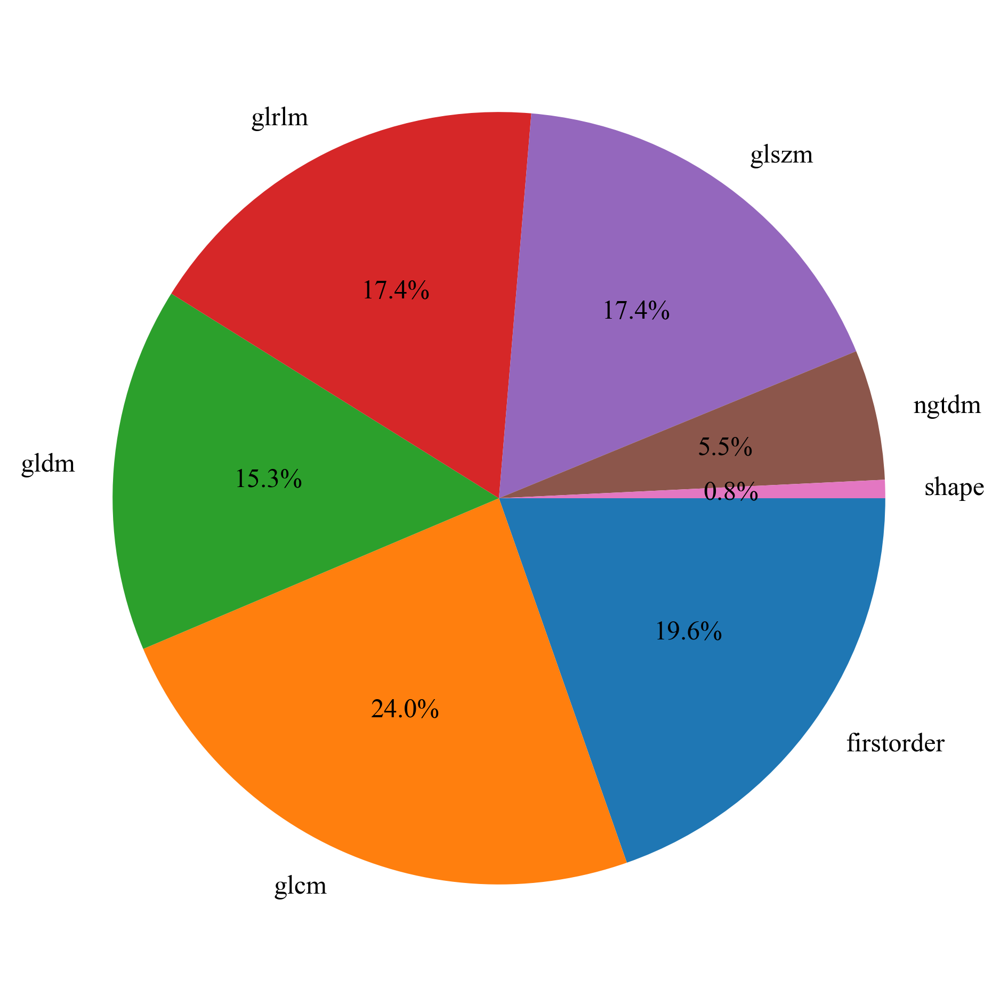

In [7]:
import matplotlib.pyplot as plt
sorted_counts = pd.DataFrame([c.split('_')[-2] for c in rad_data.columns if c !='ID']).value_counts()
sorted_counts = pd.DataFrame(sorted_counts, columns=['count']).reset_index()
sorted_counts = sorted_counts.sort_values(0)
display(sorted_counts)
plt.pie(sorted_counts['count'], labels=[i for i in sorted_counts[0]], startangle=0,
        counterclock = False, autopct = '%.1f%%')
plt.savefig(f'img/{task_type}feature_ratio.svg', bbox_inches = 'tight')

## 标注数据

数据以csv格式进行存储，这里如果是其他格式，可以使用自定义函数读取出每个样本的结果。

要求label_data为一个`DataFrame`格式，包括ID列以及后续的labels列，可以是多列，支持Multi-Task。

In [8]:
label_data = pd.read_csv(labelf)
label_data['ID'] = label_data['ID']
label_data

,ID,label,group
0,251.nii.gz,0,test1
1,252.nii.gz,0,test1
2,253.nii.gz,0,test1
3,254.nii.gz,0,test1
4,255.nii.gz,0,test1
...,...,...,...
617,7.nii.gz,0,val
618,74.nii.gz,1,val
619,87.nii.gz,1,val
620,92.nii.gz,0,val


## 特征拼接 

将标注数据`label_data`与`rad_data`进行合并，得到训练数据。

**注意：** 
1. 需要删掉ID这一列
2. 如果发现数据少了，需要自行检查数据是否匹配。

In [9]:
from onekey_algo.custom.utils import print_join_info

print_join_info(rad_data, label_data)
combined_data = pd.merge(rad_data, label_data, on=['ID'], how='inner')
ids = combined_data['ID']
combined_data = combined_data.drop(['ID'], axis=1)
print(combined_data[labels].value_counts())
combined_data.columns

[2025-04-24 09:20:34 - <frozen onekey_algo.custom.utils>:  63]	WARNING	存在ID特征不完全匹配的问题！在左边不在右边的ID：{'317.nii.gz', '298.nii.gz', '305.nii.gz', '250.nii.gz'}；在右边不在左边的ID：set()


label
1        430
0        192
dtype: int64


Index(['exponential_firstorder_10Percentile',
       'exponential_firstorder_90Percentile', 'exponential_firstorder_Energy',
       'exponential_firstorder_Entropy',
       'exponential_firstorder_InterquartileRange',
       'exponential_firstorder_Kurtosis', 'exponential_firstorder_Maximum',
       'exponential_firstorder_Mean',
       'exponential_firstorder_MeanAbsoluteDeviation',
       'exponential_firstorder_Median',
       ...
       'wavelet_LLL_glszm_ZoneEntropy', 'wavelet_LLL_glszm_ZonePercentage',
       'wavelet_LLL_glszm_ZoneVariance', 'wavelet_LLL_ngtdm_Busyness',
       'wavelet_LLL_ngtdm_Coarseness', 'wavelet_LLL_ngtdm_Complexity',
       'wavelet_LLL_ngtdm_Contrast', 'wavelet_LLL_ngtdm_Strength', 'label',
       'group'],
      dtype='object', length=1836)

## 获取到数据的统计信息

1. count，统计样本个数。
2. mean、std, 对应特征的均值、方差
3. min, 25%, 50%, 75%, max，对应特征的最小值，25,50,75分位数，最大值。

In [10]:
combined_data.describe()

,exponential_firstorder_10Percentile,exponential_firstorder_90Percentile,exponential_firstorder_Energy,exponential_firstorder_Entropy,exponential_firstorder_InterquartileRange,exponential_firstorder_Kurtosis,exponential_firstorder_Maximum,exponential_firstorder_Mean,exponential_firstorder_MeanAbsoluteDeviation,exponential_firstorder_Median,...,wavelet_LLL_glszm_SmallAreaLowGrayLevelEmphasis,wavelet_LLL_glszm_ZoneEntropy,wavelet_LLL_glszm_ZonePercentage,wavelet_LLL_glszm_ZoneVariance,wavelet_LLL_ngtdm_Busyness,wavelet_LLL_ngtdm_Coarseness,wavelet_LLL_ngtdm_Complexity,wavelet_LLL_ngtdm_Contrast,wavelet_LLL_ngtdm_Strength,label
count,622.000,622.000,6.220e+02,6.220e+02,622.000,622.000,622.000,622.000,622.000,622.000,...,6.220e+02,622.000,622.000,622.000,6.220e+02,6.220e+02,6.220e+02,622.000,622.000,622.000
mean,5.547,60.199,5.492e+09,3.316e+00,21.559,411.891,1161.588,31.257,25.074,19.462,...,1.033e-03,8.794,0.936,0.109,1.153e-03,3.281e-03,1.098e+07,62.152,624.923,0.691
std,5.108,113.527,7.250e+09,9.808e-01,17.479,619.177,853.329,28.654,37.656,14.992,...,3.050e-03,0.582,0.021,0.555,1.735e-03,2.222e-03,5.887e+06,481.089,313.811,0.462
min,0.178,2.306,2.707e+07,-3.200e-16,1.169,1.534,4.719,1.229,0.772,0.952,...,1.024e-05,4.755,0.857,0.000,3.830e-04,1.619e-04,3.506e+05,0.665,92.793,0.000
25%,2.279,26.070,1.595e+09,2.747e+00,10.673,24.324,240.335,14.985,8.621,10.542,...,1.942e-04,8.714,0.921,0.060,6.393e-04,1.610e-03,6.880e+06,3.431,401.412,0.000
50%,4.290,38.399,3.714e+09,3.232e+00,16.419,123.809,1221.572,22.968,15.005,15.134,...,3.122e-04,8.922,0.935,0.084,8.312e-04,2.578e-03,1.066e+07,5.910,573.846,1.000
75%,6.889,66.954,6.130e+09,3.945e+00,26.379,537.526,1947.952,38.662,26.868,24.049,...,7.205e-04,9.076,0.950,0.109,1.066e-03,4.549e-03,1.345e+07,12.032,786.435,1.000
max,37.931,2096.541,7.000e+10,5.765e+00,136.978,3947.918,2923.566,257.552,389.584,96.067,...,4.661e-02,9.916,1.000,13.895,2.450e-02,1.180e-02,5.308e+07,9185.341,2222.956,1.000


## Z-score

`normalize_df` 为onekey中正则化的API，将数据变化到0均值1方差。正则化的方法为

$column = \frac{column - mean}{std}$

In [11]:
from onekey_algo.custom.components.comp1 import normalize_df
data = normalize_df(combined_data, not_norm=labels, group=group_info, use_train=True)
data = data.dropna(axis=1)
data.describe()

[2025-04-24 09:20:35 - <frozen onekey_algo.custom.components.comp1>: 200]	INFO	正在使用训练集预定数据进行标准化。


,exponential_firstorder_10Percentile,exponential_firstorder_90Percentile,exponential_firstorder_Energy,exponential_firstorder_Entropy,exponential_firstorder_InterquartileRange,exponential_firstorder_Kurtosis,exponential_firstorder_Maximum,exponential_firstorder_Mean,exponential_firstorder_MeanAbsoluteDeviation,exponential_firstorder_Median,...,wavelet_LLL_glszm_SmallAreaLowGrayLevelEmphasis,wavelet_LLL_glszm_ZoneEntropy,wavelet_LLL_glszm_ZonePercentage,wavelet_LLL_glszm_ZoneVariance,wavelet_LLL_ngtdm_Busyness,wavelet_LLL_ngtdm_Coarseness,wavelet_LLL_ngtdm_Complexity,wavelet_LLL_ngtdm_Contrast,wavelet_LLL_ngtdm_Strength,label
count,622.000,622.000,622.000,622.000,622.000,622.000,622.000,622.000,622.000,622.000,...,622.000,622.000,622.000,622.000,622.000,622.000,622.000,622.000,622.000,622.000
mean,-0.135,-0.034,-0.085,-0.199,-0.089,-0.088,-0.147,-0.072,-0.015,-0.121,...,1.147,-0.418,0.223,0.476,0.610,0.300,-0.071,5.061,0.201,0.691
std,0.937,1.260,0.939,1.105,1.005,0.965,1.051,1.048,1.086,0.951,...,6.054,1.973,1.164,16.694,4.274,1.275,1.133,45.243,1.107,0.462
min,-1.120,-0.676,-0.793,-3.934,-1.261,-0.728,-1.572,-1.171,-0.716,-1.295,...,-0.883,-14.112,-4.073,-2.806,-1.288,-1.490,-2.116,-0.721,-1.676,0.000
25%,-0.734,-0.412,-0.590,-0.840,-0.714,-0.692,-1.282,-0.668,-0.490,-0.686,...,-0.518,-0.688,-0.568,-0.992,-0.657,-0.659,-0.860,-0.461,-0.587,0.000
50%,-0.365,-0.276,-0.315,-0.294,-0.384,-0.537,-0.073,-0.376,-0.306,-0.395,...,-0.284,0.018,0.199,-0.267,-0.184,-0.104,-0.133,-0.228,0.021,1.000
75%,0.112,0.041,-0.003,0.509,0.189,0.108,0.822,0.199,0.036,0.170,...,0.526,0.539,0.986,0.469,0.394,1.027,0.405,0.348,0.771,1.000
max,5.809,22.568,8.266,2.559,6.547,5.421,2.024,8.207,10.497,4.738,...,91.607,3.387,3.697,415.204,58.131,5.186,8.035,863.023,5.837,1.000


## 统计检验

通过ttest或者utest进行特征筛选。

**注意** ：此步骤不是论文的标配，所以用不用在自己的选择，可以通过修改pvalue的值进行调整，默认是0.05为显著。

In [12]:
import seaborn as sns
from onekey_algo.custom.components.stats import clinic_stats

sub_data = data[data['group'] == 'train']
stats = clinic_stats(sub_data, stats_columns=list(data.columns[0:-2]), label_column=labels[0], 
                     continuous_columns=list(data.columns[0:-2]), verbose=False)
stats

,feature_name,-label=ALL,-label=0,-label=1,pvalue
0,exponential_firstorder_10Percentile,0.00±1.00,0.13±0.77,-0.06±1.08,<0.001
1,exponential_firstorder_90Percentile,-0.00±1.00,0.10±0.51,-0.04±1.15,<0.001
2,exponential_firstorder_Energy,0.00±1.00,0.15±1.46,-0.06±0.71,0.952
3,exponential_firstorder_Entropy,0.00±1.00,0.39±0.95,-0.17±0.97,<0.001
4,exponential_firstorder_InterquartileRange,-0.00±1.00,0.39±1.17,-0.17±0.87,<0.001
...,...,...,...,...,...
1827,wavelet_LLL_ngtdm_Busyness,-0.00±1.00,0.12±1.43,-0.05±0.74,0.401
1828,wavelet_LLL_ngtdm_Coarseness,-0.00±1.00,-0.00±1.05,0.00±0.98,0.708
1829,wavelet_LLL_ngtdm_Complexity,-0.00±1.00,0.19±0.86,-0.08±1.05,<0.001
1830,wavelet_LLL_ngtdm_Contrast,-0.00±1.00,0.13±0.98,-0.05±1.00,0.033


#### 输出特征分布的图

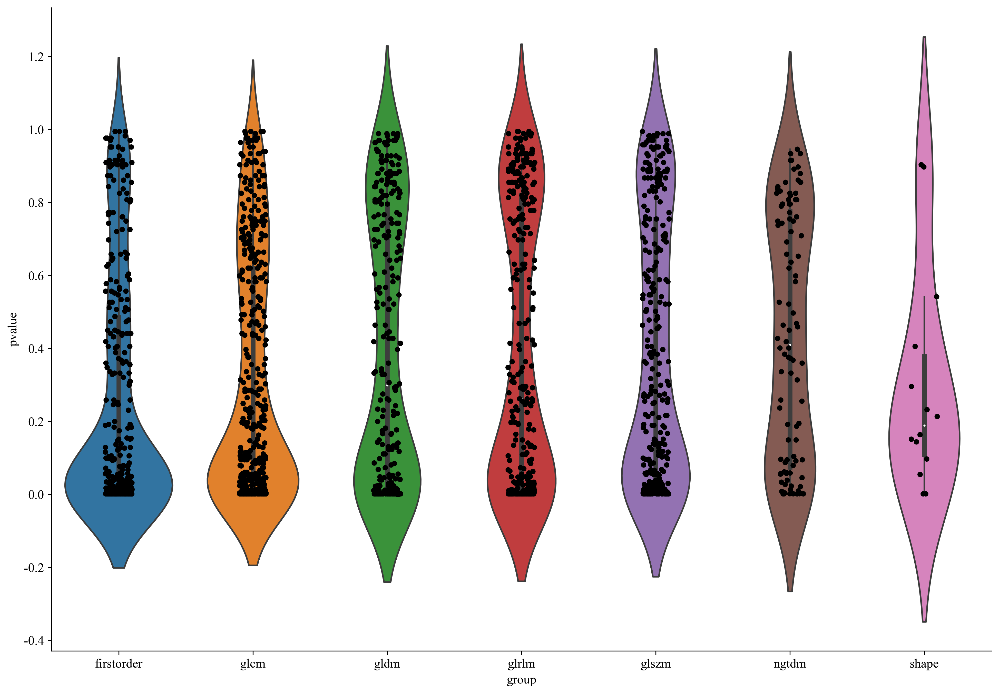

In [13]:
import matplotlib.pyplot as plt

def map2float(x):
    try:
        return float(str(x)[1:])
    except:
        return 1

stats[['pvalue']] = stats[['pvalue']].applymap(map2float)
stats[['group']] = stats[['feature_name']].applymap(lambda x: x.split('_')[-2])
stats = stats[['feature_name', 'pvalue', 'group']]
g = sns.catplot(x="group", y="pvalue", data=stats, kind="violin")
g.fig.set_size_inches(15,10)
sns.stripplot(x="group", y="pvalue", data=stats, ax=g.ax, color='black')
plt.savefig(f'img/{task_type}feature_stats.svg', bbox_inches = 'tight')

#### 调整pvalue进行筛选。

In [14]:
pvalue = get_param_in_cwd('p_value', 0.05)
sel_feature = list(stats[stats['pvalue'] < pvalue]['feature_name']) + labels + [group_info]
data = data[sel_feature]
data

,exponential_firstorder_10Percentile,exponential_firstorder_90Percentile,exponential_firstorder_Entropy,exponential_firstorder_InterquartileRange,exponential_firstorder_Kurtosis,exponential_firstorder_Mean,exponential_firstorder_MeanAbsoluteDeviation,exponential_firstorder_Median,exponential_firstorder_Minimum,exponential_firstorder_RobustMeanAbsoluteDeviation,...,wavelet_LLL_glcm_Idn,wavelet_LLL_glcm_SumSquares,wavelet_LLL_gldm_GrayLevelVariance,wavelet_LLL_glrlm_GrayLevelVariance,wavelet_LLL_glszm_GrayLevelVariance,wavelet_LLL_ngtdm_Complexity,wavelet_LLL_ngtdm_Contrast,wavelet_LLL_ngtdm_Strength,label,group
297,-0.904,-0.406,-1.020,-0.492,-0.722,-0.763,-0.481,-0.843,27.660,-0.544,...,-9.288,1.878,0.668,0.654,0.490,-1.970,541.255,0.703,0,test1
298,-0.844,0.651,0.645,0.979,-0.674,1.407,1.764,-0.007,4.627,1.309,...,-4.347,1.519,1.228,1.220,1.129,-1.533,39.781,2.206,0,test1
299,-0.604,0.400,1.000,1.023,-0.703,0.349,0.213,0.439,1.643,1.122,...,-4.473,1.184,1.011,1.010,0.988,-0.868,7.172,1.556,0,test1
300,-0.296,0.597,1.214,1.212,-0.660,0.648,0.578,0.222,-0.769,1.368,...,-1.134,-0.197,-0.265,-0.267,-0.289,-0.533,0.116,-0.279,0,test1
301,-0.699,-0.570,-2.035,-1.072,-0.563,-0.976,-0.646,-1.007,-0.473,-1.060,...,1.104,-1.288,-1.346,-1.347,-1.353,-0.674,-0.656,-1.221,0,test1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
533,-0.812,0.235,0.490,0.335,-0.510,0.271,0.574,-0.573,-0.512,0.549,...,0.196,-0.788,-0.934,-0.937,-0.967,0.946,-0.588,-1.490,0,val
546,-0.342,0.227,0.906,0.739,-0.372,0.184,0.139,0.136,-0.728,0.714,...,0.110,0.014,0.100,0.101,0.105,1.188,-0.407,-0.484,1,val
586,0.296,0.259,1.014,0.824,-0.213,0.383,0.172,0.476,-0.659,0.738,...,-0.946,-0.217,-0.080,-0.080,-0.068,-0.909,0.432,0.505,1,val
602,0.043,-0.175,0.109,-0.159,-0.673,-0.318,-0.329,-0.128,0.460,-0.189,...,-0.272,-0.653,-0.764,-0.766,-0.793,-0.461,-0.445,-1.098,0,val


### 相关系数

计算相关系数的方法有3种可供选择
1. pearson （皮尔逊相关系数）: standard correlation coefficient

2. kendall (肯德尔相关性系数) : Kendall Tau correlation coefficient

3. spearman (斯皮尔曼相关性系数): Spearman rank correlation

三种相关系数参考：https://blog.csdn.net/zmqsdu9001/article/details/82840332

In [15]:
# 相关系数视频
onekey_show('传统组学任务|相关系数')

[2025-04-24 09:20:59 - <frozen onekey_algo.custom.Manager>: 138]	INFO	播放视频功能已经设置成：Disable！


In [16]:
pearson_corr = data[data['group'] == 'train'][[c for c in data.columns if c not in labels]].corr('pearson')
# kendall_corr = data.corr('kendall')
# spearman_corr = data.corr('spearman')

### 相关系数可视化

通过修改变量名，可以可视化不同相关系数下的相关矩阵。

**注意**：当特征特别多的时候（大于100），尽量不要可视化，否则运行时间会特别长。

In [17]:
import seaborn as sns
from onekey_algo.custom.components.comp1 import draw_matrix
if data.shape[1] < 100:
    plt.figure(figsize=(50.0, 40.0))
    # 选择可视化的相关系数
    draw_matrix(pearson_corr, annot=True, cmap='YlGnBu', cbar=False)
    plt.savefig(f'img/{task_type}feature_corr.svg', bbox_inches = 'tight')

### 聚类分析

通过修改变量名，可以可视化不同相关系数下的相聚类分析矩阵。

注意：当特征特别多的时候（大于100），尽量不要可视化，否则运行时间会特别长。

In [18]:
import seaborn as sns
import matplotlib.pyplot as plt

if data.shape[1] < 100:
    pp = sns.clustermap(pearson_corr, linewidths=.5, figsize=(50.0, 40.0), cmap='YlGnBu')
    plt.setp(pp.ax_heatmap.get_yticklabels(), rotation=0)
    plt.savefig(f'img/{task_type}feature_cluster.svg', bbox_inches = 'tight')

### 特征筛选 -- 相关系数

根据相关系数，对于相关性比较高的特征（一般文献取corr>0.9），两者保留其一。

```python
def select_feature(corr, threshold: float = 0.9, keep: int = 1, topn=10, verbose=False):
    """
    * corr, 相关系数矩阵。
    * threshold，筛选的相关系数的阈值，大于阈值的两者保留其一（可以根据keep修改，可以是其二...）。默认阈值为0.9
    * keep，可以选择大于相关系数，保留几个，默认只保留一个。
    * topn, 每次去掉多少重复特征。
    * verbose，是否打印日志
    """
```

In [19]:
# 特征筛选视频
onekey_show('传统组学任务|特征筛选')

[2025-04-24 09:20:59 - <frozen onekey_algo.custom.Manager>: 138]	INFO	播放视频功能已经设置成：Disable！


In [20]:
from onekey_algo.custom.components.comp1 import select_feature, select_feature_mrmr
sel_feature = select_feature(pearson_corr, threshold=0.9, topn=128, verbose=False)
if get_param_in_cwd('mrmr_sel_feature_num', None) is not None:
    num_features = min(len(sel_feature), get_param_in_cwd('mrmr_sel_feature_num'))
    sel_feature = select_feature_mrmr(data[data['group'] == 'train'][sel_feature + labels], num_features=num_features)
sel_feature += labels + [group_info]
sel_feature

['exponential_firstorder_90Percentile',
 'exponential_firstorder_Minimum',
 'exponential_firstorder_Skewness',
 'exponential_glcm_Correlation',
 'exponential_glcm_Idmn',
 'exponential_glcm_Idn',
 'exponential_glcm_Imc1',
 'exponential_glcm_Imc2',
 'exponential_gldm_DependenceEntropy',
 'exponential_gldm_LargeDependenceLowGrayLevelEmphasis',
 'exponential_glrlm_ShortRunLowGrayLevelEmphasis',
 'exponential_glszm_GrayLevelNonUniformityNormalized',
 'exponential_glszm_GrayLevelVariance',
 'exponential_glszm_LowGrayLevelZoneEmphasis',
 'exponential_glszm_SizeZoneNonUniformity',
 'exponential_glszm_SmallAreaLowGrayLevelEmphasis',
 'exponential_glszm_ZoneEntropy',
 'exponential_glszm_ZoneVariance',
 'exponential_ngtdm_Busyness',
 'exponential_ngtdm_Strength',
 'gradient_firstorder_InterquartileRange',
 'gradient_glcm_Idn',
 'gradient_gldm_DependenceEntropy',
 'gradient_gldm_LargeDependenceHighGrayLevelEmphasis',
 'gradient_glszm_GrayLevelNonUniformityNormalized',
 'gradient_glszm_LargeAreaHig

### 过滤特征

通过`sel_feature`过滤出筛选出来的特征。

In [21]:
sel_data = data[sel_feature]
sel_data.describe()

,exponential_firstorder_90Percentile,exponential_firstorder_Minimum,exponential_firstorder_Skewness,exponential_glcm_Correlation,exponential_glcm_Idmn,exponential_glcm_Idn,exponential_glcm_Imc1,exponential_glcm_Imc2,exponential_gldm_DependenceEntropy,exponential_gldm_LargeDependenceLowGrayLevelEmphasis,...,wavelet_LLL_glcm_ClusterShade,wavelet_LLL_glcm_DifferenceAverage,wavelet_LLL_glcm_DifferenceEntropy,wavelet_LLL_glcm_DifferenceVariance,wavelet_LLL_glcm_Idn,wavelet_LLL_glszm_GrayLevelVariance,wavelet_LLL_ngtdm_Complexity,wavelet_LLL_ngtdm_Contrast,wavelet_LLL_ngtdm_Strength,label
count,622.000,622.000,622.000,622.000,622.000,622.000,622.000,622.000,622.000,622.000,...,622.000,622.000,622.000,622.000,622.000,622.000,622.000,622.000,622.000,622.000
mean,-0.034,0.496,-0.104,0.023,-0.288,-0.232,-0.161,-0.007,-0.339,0.156,...,-0.016,0.334,-0.240,0.180,-0.443,0.137,-0.071,5.061,0.201,0.691
std,1.260,4.502,0.972,1.102,1.501,1.303,1.314,1.071,1.377,1.169,...,1.277,1.372,1.796,1.108,1.650,1.061,1.133,45.243,1.107,0.462
min,-0.676,-0.884,-1.128,-1.902,-10.759,-7.267,-11.612,-3.877,-7.470,-0.437,...,-17.516,-1.795,-15.725,-1.499,-9.288,-1.547,-2.116,-0.721,-1.676,0.000
25%,-0.412,-0.577,-0.857,-0.745,-0.535,-0.963,-0.640,-0.803,-0.878,-0.366,...,-0.419,-0.505,-0.741,-0.589,-0.965,-0.640,-0.860,-0.461,-0.587,0.000
50%,-0.276,-0.208,-0.472,-0.212,0.253,0.269,0.223,-0.078,-0.197,-0.245,...,0.172,0.024,0.090,0.072,-0.114,-0.033,-0.133,-0.228,0.021,1.000
75%,0.041,0.252,0.410,0.532,0.561,0.750,0.715,0.725,0.546,0.103,...,0.603,0.812,0.736,0.689,0.656,0.649,0.405,0.348,0.771,1.000
max,22.568,91.875,3.543,7.506,0.660,1.190,1.631,2.903,2.886,7.630,...,6.848,6.989,3.160,5.982,1.720,6.263,8.035,863.023,5.837,1.000


### 样本可视化

根据特征和label信息，将rad features降维到2维，看不同的label样本在二维空间的分布。

**注意**：由于特征空间维度极高，降维难免会有损失，所以二维的可视化仅供参考。

目前支持的:

| **降维方法** | **Method名称**                                                 |
| ------------ | ------------------------------------------------------------ |
| LLE      | Standard LLE, Modified LLE                                   |
| PCA      | t-SNE, NCA                                                      |
| SVD      | Truncated SVD                                              |
| Model Based      | Random projection, Isomap, MDS, Random Trees,Spectral       |

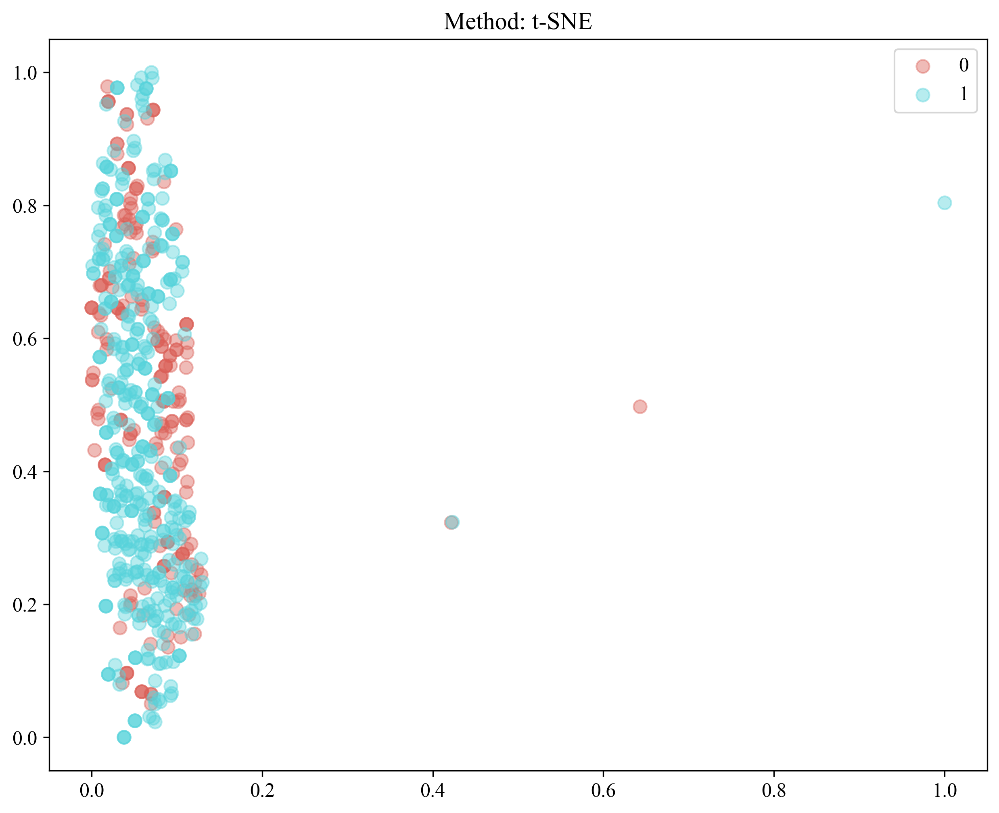

In [22]:
from onekey_algo.custom.components.comp1 import analysis_features
analysis_features(sel_data[sel_feature[:-2]], data[labels[0]], methods='t-SNE')

## 构建数据

将样本的训练数据X与监督信息y分离出来，并且对训练数据进行划分，一般的划分原则为80%-20%

In [23]:
import numpy as np
import onekey_algo.custom.components as okcomp

n_classes = 2
train_data = sel_data[(sel_data[group_info] == 'train')]
train_ids = ids[train_data.index]
train_data = train_data.reset_index()
train_data = train_data.drop('index', axis=1)
y_data = train_data[labels]
X_data = train_data.drop(labels + [group_info], axis=1)

test_data = sel_data[sel_data[group_info] != 'train']
test_ids = ids[test_data.index]
test_data = test_data.reset_index()
test_data = test_data.drop('index', axis=1)
y_test_data = test_data[labels]
X_test_data = test_data.drop(labels + [group_info], axis=1)

y_all_data = sel_data[labels]
X_all_data = sel_data.drop(labels + [group_info], axis=1)

column_names = X_data.columns
print(f"训练集样本数：{X_data.shape}, 验证集样本数：{X_test_data.shape}")

训练集样本数：(429, 222), 验证集样本数：(193, 222)


### Lasso

初始化Lasso模型，alpha为惩罚系数。具体的参数文档可以参考：[文档](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.Lasso.html?highlight=lasso#sklearn.linear_model.Lasso)

### 交叉验证

不同Lambda下的，特征的的权重大小。
```python
def lasso_cv_coefs(X_data, y_data, points=50, column_names: List[str] = None, **kwargs):
    """

    Args:
        X_data: 训练数据
        y_data: 监督数据
        points: 打印多少个点。默认50
        column_names: 列名，默认为None，当选择的数据很多的时候，建议不要添加此参数
        **kwargs: 其他用于打印控制的参数。

    """
 ```

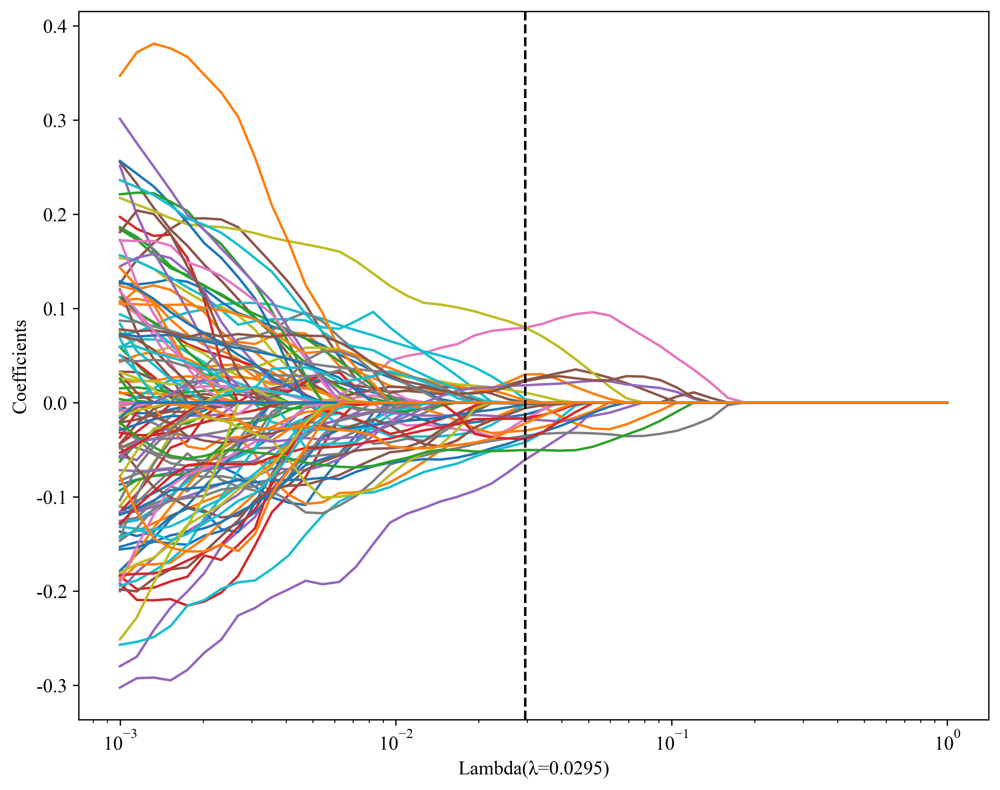

In [24]:
alpha = okcomp.comp1.lasso_cv_coefs(X_data, y_data, column_names=None, ensure_lastn=-40)
plt.savefig(f'img/{task_type}feature_lasso.svg', bbox_inches = 'tight')

### 模型效能

```python
def lasso_cv_efficiency(X_data, y_data, points=50, **kwargs):
    """

    Args:
        Xdata: 训练数据
        ydata: 测试数据
        points: 打印的数据密度
        **kwargs: 其他的图像样式
            # 数据点标记, fmt="o"
            # 数据点大小, ms=3
            # 数据点颜色, mfc="r"
            # 数据点边缘颜色, mec="r"
            # 误差棒颜色, ecolor="b"
            # 误差棒线宽, elinewidth=2
            # 误差棒边界线长度, capsize=2
            # 误差棒边界厚度, capthick=1
    Returns:
    """
 ```

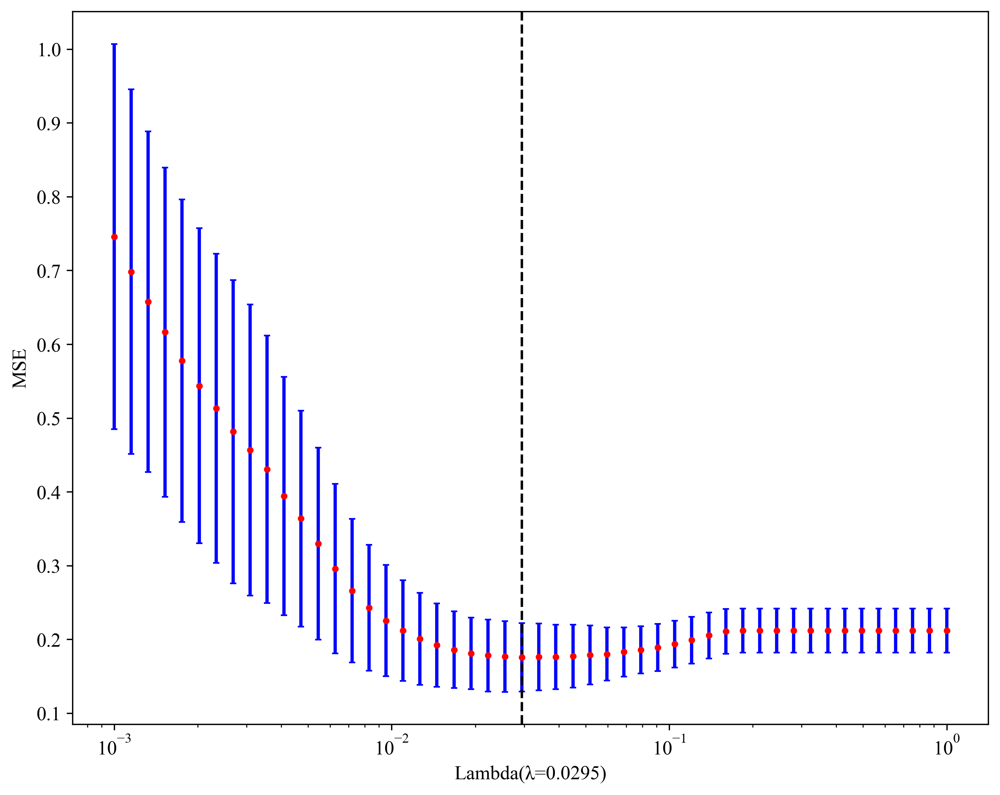

In [25]:
okcomp.comp1.lasso_cv_efficiency(X_data, y_data, points=50, y_major_locator=0.1)
plt.savefig(f'img/{task_type}feature_mse.svg', bbox_inches = 'tight')

### 惩罚系数

使用交叉验证的惩罚系数作为模型训练的基础。

In [26]:
from sklearn import linear_model

models = []
for label in labels:
    clf = linear_model.Lasso(alpha=alpha)
    clf.fit(X_data, y_data[label])
    models.append(clf)

### 特征筛选

筛选出其中coef > 0的特征。并且打印出相应的公式。

In [27]:
COEF_THRESHOLD = 1e-6 # 筛选的特征阈值
scores = []
selected_features = []
for label, model in zip(labels, models):
    feat_coef = [(feat_name, coef) for feat_name, coef in zip(column_names, model.coef_) 
                 if COEF_THRESHOLD is None or abs(coef) > COEF_THRESHOLD]
    selected_features.append([feat for feat, _ in feat_coef])
    formula = ' '.join([f"{coef:+.6f} * {feat_name}" for feat_name, coef in feat_coef])
    score = f"{label} = {model.intercept_} {'+' if formula[0] != '-' else ''} {formula}"
    scores.append(score)
    
print(scores[0])

label = 0.6993006993006987 + +0.029707 * exponential_glszm_GrayLevelNonUniformityNormalized +0.023725 * lbp_3D_k_gldm_DependenceEntropy -0.042370 * lbp_3D_k_glrlm_RunVariance -0.060812 * lbp_3D_m2_glrlm_LongRunHighGrayLevelEmphasis +0.079294 * lbp_3D_m2_glrlm_ShortRunEmphasis +0.003568 * lbp_3D_m2_glszm_GrayLevelNonUniformityNormalized +0.079858 * log_sigma_1_0_mm_3D_glszm_LargeAreaHighGrayLevelEmphasis -0.012845 * log_sigma_3_0_mm_3D_firstorder_Skewness -0.001909 * log_sigma_3_0_mm_3D_glcm_ClusterShade +0.010484 * logarithm_glszm_ZoneVariance -0.035346 * original_shape_Sphericity -0.001889 * square_glszm_GrayLevelVariance -0.017579 * squareroot_firstorder_10Percentile -0.002398 * squareroot_firstorder_90Percentile -0.029882 * wavelet_HHH_firstorder_Maximum -0.017558 * wavelet_HHH_glcm_Correlation -0.001759 * wavelet_HHL_firstorder_Mean -0.037423 * wavelet_HLH_glcm_Correlation -0.038779 * wavelet_HLH_glszm_GrayLevelVariance -0.006139 * wavelet_HLH_glszm_ZoneEntropy +0.002211 * wavelet_

### 特征权重

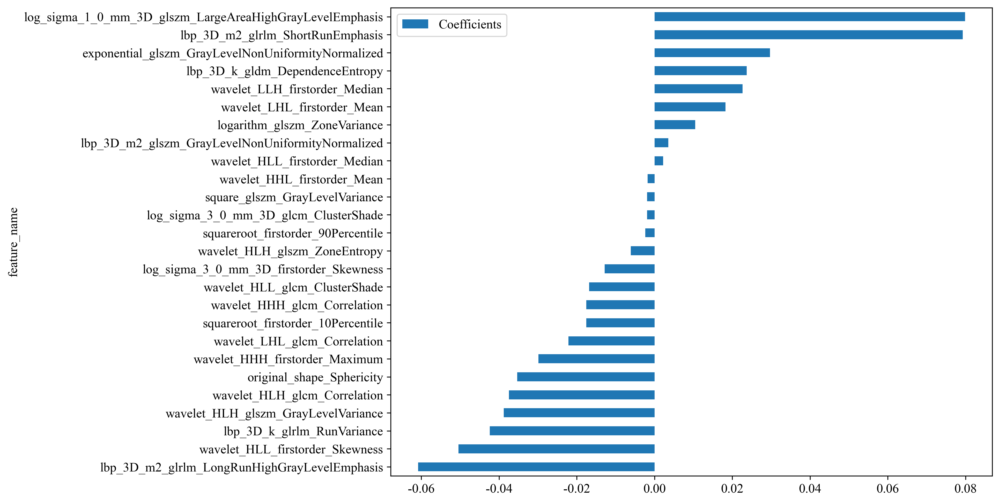

In [28]:
feat_coef = sorted(feat_coef, key=lambda x: x[1])
feat_coef_df = pd.DataFrame(feat_coef, columns=['feature_name', 'Coefficients'])
feat_coef_df.plot(x='feature_name', y='Coefficients', kind='barh')

plt.savefig(f'img/{task_type}feature_weights.svg', bbox_inches = 'tight')

### 进一步筛选特征

使用Lasso筛选出来的Coefficients比较高的特征作为训练数据。

In [29]:
X_data = X_data[selected_features[0]]
X_test_data = X_test_data[selected_features[0]]
X_data.columns

Index(['exponential_glszm_GrayLevelNonUniformityNormalized',
       'lbp_3D_k_gldm_DependenceEntropy', 'lbp_3D_k_glrlm_RunVariance',
       'lbp_3D_m2_glrlm_LongRunHighGrayLevelEmphasis',
       'lbp_3D_m2_glrlm_ShortRunEmphasis',
       'lbp_3D_m2_glszm_GrayLevelNonUniformityNormalized',
       'log_sigma_1_0_mm_3D_glszm_LargeAreaHighGrayLevelEmphasis',
       'log_sigma_3_0_mm_3D_firstorder_Skewness',
       'log_sigma_3_0_mm_3D_glcm_ClusterShade', 'logarithm_glszm_ZoneVariance',
       'original_shape_Sphericity', 'square_glszm_GrayLevelVariance',
       'squareroot_firstorder_10Percentile',
       'squareroot_firstorder_90Percentile', 'wavelet_HHH_firstorder_Maximum',
       'wavelet_HHH_glcm_Correlation', 'wavelet_HHL_firstorder_Mean',
       'wavelet_HLH_glcm_Correlation', 'wavelet_HLH_glszm_GrayLevelVariance',
       'wavelet_HLH_glszm_ZoneEntropy', 'wavelet_HLL_firstorder_Median',
       'wavelet_HLL_firstorder_Skewness', 'wavelet_HLL_glcm_ClusterShade',
       'wavelet_LHL_fir

## 模型筛选

根据筛选出来的数据，做模型的初步选择。当前主要使用到的是Onekey中的

1. SVM，支持向量机，引用参考。
2. KNN，K紧邻，引用参考。
3. Decision Tree，决策树，引用参考。
4. Random Forests, 随机森林，引用参考。
5. XGBoost, bosting方法。引用参考。
6. LightGBM, bosting方法，引用参考。

In [30]:
from sklearn.ensemble import ExtraTreesClassifier, RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn.neural_network import MLPClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC

model_names = get_param_in_cwd('ml_models')
models = okcomp.comp1.create_clf_model_none_overfit(model_names)

models['LR'] = LogisticRegression(penalty='none', max_iter=100)
models['SVM'] = SVC(probability=True, max_iter=100)
models['RandomForest'] = RandomForestClassifier(n_estimators=50, max_depth=3,
                                                    min_samples_split=4, random_state=1)
models['XGBoost'] = XGBClassifier(n_estimators=100, objective='binary:logistic', max_depth=3, min_child_weight=.2,
                                          use_label_encoder=False, eval_metric='error')
models['LightGBM'] = LGBMClassifier(n_estimators=20,  max_depth=4, min_child_weight=0.5,)
models['ExtraTrees'] = ExtraTreesClassifier(n_estimators=60, max_depth=5, min_samples_split=2, random_state=1)
models['GradientBoosting'] = GradientBoostingClassifier(n_estimators=10, random_state=100)
models['AdaBoost'] = AdaBoostClassifier(n_estimators=10, random_state=100)
model_names = list(models.keys())

### 交叉验证

`n_trails`指定随机次数，每次采用的是80%训练，随机20%进行测试，找到最好的模型，以及对应的最好的数据划分。


```python
def get_bst_split(X_data: pd.DataFrame, y_data: pd.DataFrame,
            models: dict, test_size=0.2, metric_fn=accuracy_score, n_trails=10,
            cv: bool = False, shuffle: bool = False, metric_cut_off: float = None, random_state=None):
    """
    寻找数据集中最好的数据划分。
    Args:
        X_data: 训练数据
        y_data: 监督数据
        models: 模型名称，Dict类型、
        test_size: 测试集比例，只有当cv=False时生效
        metric_fn: 评价模型好坏的函数，默认准确率，可选roc_auc_score。
        n_trails: 尝试多少次寻找最佳数据集划分。
        cv: 是否是交叉验证，默认是False，当为True时，n_trails为交叉验证的n_fold
        shuffle: 是否进行随机打乱
        metric_cut_off: 当metric_fn的值达到多少时进行截断。
        random_state: 随机种子

    Returns: {'max_idx': max_idx, "max_model": max_model, "max_metric": max_metric, "results": results}

    """
```

**注意：这里采用了【挑数据】，如果想要严谨，请修改`n_trails=1`。**

[2025-04-24 09:21:06 - <frozen onekey_algo.custom.components.comp1>: 510]	WARNING	当cv=True的时候，采用的是交叉验证的模式，此时test_size的参数是不生效的，我们将忽略这个test_size设置。如果需要手动指定测试集比例，请修改cv=False。


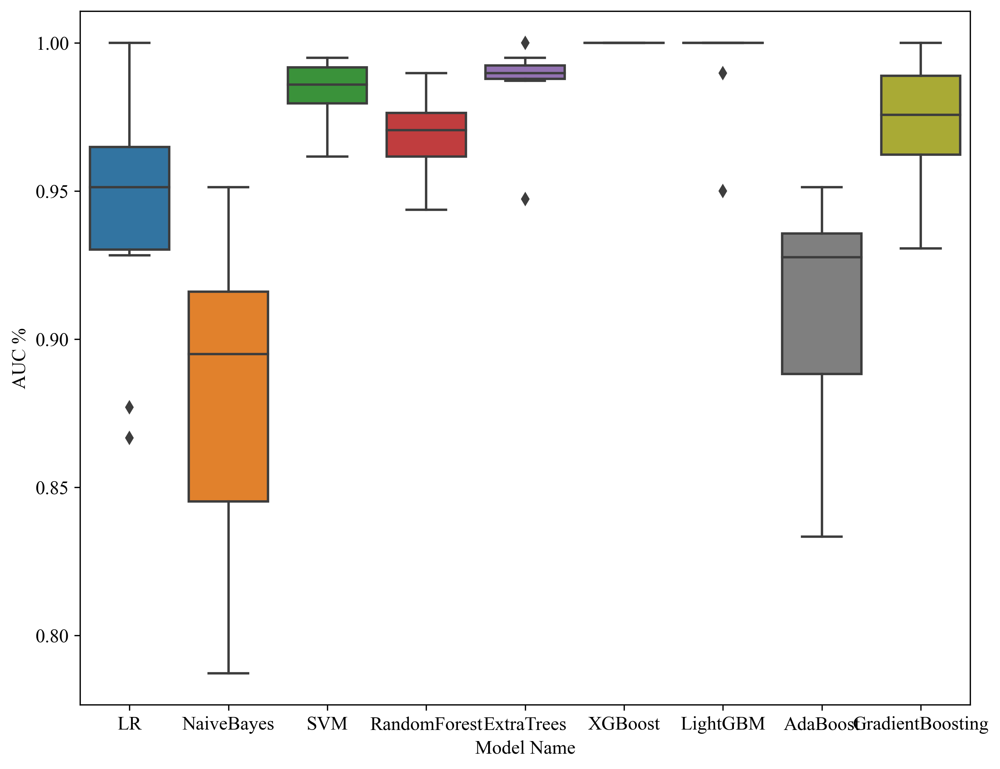

In [31]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.metrics import accuracy_score, roc_auc_score

# 随机使用n_trails次数据划分，找到最好的一次划分方法，并且保存在results中。
results = okcomp.comp1.get_bst_split(X_data, y_data, models, test_size=0.2, metric_fn=roc_auc_score, n_trails=10, cv=True, random_state=10)
_, (X_train_sel, X_test_sel, y_train_sel, y_test_sel) = results['results'][results['max_idx']]
X_train_sel, X_test_sel, y_train_sel, y_test_sel = X_data, X_test_data, y_data, y_test_data
trails, _ = zip(*results['results'])
cv_results = pd.DataFrame(trails, columns=model_names)
# 可视化每个模型在不同的数据划分中的效果。
sns.boxplot(data=cv_results)
plt.ylabel('AUC %')
plt.xlabel('Model Name')
plt.savefig(f'img/{task_type}model_cv.svg', bbox_inches = 'tight')

## 模型筛选

使用最好的数据划分，进行后续的模型研究。

**注意**: 一般情况下论文使用的是随机划分的数据，但也有些论文使用【刻意】筛选的数据划分。

In [32]:
import joblib
from onekey_algo.custom.components.comp1 import plot_feature_importance, plot_learning_curve, smote_resample

from sklearn.ensemble import ExtraTreesClassifier, RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn.neural_network import MLPClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier

targets = []
os.makedirs('models', exist_ok=True)
for l in labels:
    new_models = okcomp.comp1.create_clf_model_none_overfit(model_names)
    new_models['LR'] = LogisticRegression(penalty='none', max_iter=100)
    new_models['SVM'] = SVC(probability=True, max_iter=100, kernel='linear')
    new_models['RandomForest'] = RandomForestClassifier(n_estimators=6, max_depth=6,
                                                        min_samples_split=4, random_state=0)
    new_models['XGBoost'] = XGBClassifier(n_estimators=100, objective='binary:logistic', max_depth=3, min_child_weight=.2,
                                              use_label_encoder=False, eval_metric='error')
    new_models['LightGBM'] = LGBMClassifier(n_estimators=100,  max_depth=3, min_child_weight=0.5,)
    new_models['ExtraTrees'] = ExtraTreesClassifier(n_estimators=60, max_depth=15, min_samples_split=5, random_state=115)
    new_models['GradientBoosting'] = GradientBoostingClassifier(n_estimators=100, random_state=20)
    new_models['AdaBoost'] = AdaBoostClassifier(n_estimators=10, random_state=0)
    new_models['MLP'] = MLPClassifier(hidden_layer_sizes=(61, 128, 64, 32), max_iter=500, solver='sgd', random_state=1)
    model_names = list(new_models.keys())
    new_models = list(new_models.values())
    
    for mn, m in zip(model_names, new_models):
        X_train_smote, y_train_smote = X_train_sel, y_train_sel
        # 取消下一行的注释可以使用Smote进行采样，解决样本不均衡的问题。
        if get_param_in_cwd('use_smote', False):
            X_train_smote, y_train_smote = smote_resample(X_train_sel, y_train_sel)
        m.fit(X_train_smote, y_train_smote[l])
        # 保存训练的模型
        joblib.dump(m, f'models/{task_type}{mn}_{l}.pkl') 
        # 输出模型特征重要性，只针对高级树模型有用
#         plot_feature_importance(m, selected_features[0], save_dir='img')
#         plot_learning_curve(m, X_train_sel, y_train_sel, title=f'Learning Curve {mn}')
#         plt.savefig(f"img/Rad_{mn}_learning_curve.svg", bbox_inches='tight')
        plt.show()
    targets.append(new_models)

## 预测结果

* predictions，二维数据，每个label对应的每个模型的预测结果。
* pred_scores，二维数据，每个label对应的每个模型的预测概率值。

In [33]:
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import OneHotEncoder
from onekey_algo.custom.components.delong import calc_95_CI
from onekey_algo.custom.components.metrics import analysis_pred_binary

predictions = [[(model.predict(X_train_sel), model.predict(X_test_sel)) 
                for model in target] for label, target in zip(labels, targets)]
pred_scores = [[(model.predict_proba(X_train_sel), model.predict_proba(X_test_sel)) 
                for model in target] for label, target in zip(labels, targets)]

metric = []
pred_sel_idx = []
for label, prediction, scores in zip(labels, predictions, pred_scores):
    pred_sel_idx_label = []
    for mname, (train_pred, test_pred), (train_score, test_score) in zip(model_names, prediction, scores):
        # 计算训练集指数
        acc, auc, ci, tpr, tnr, ppv, npv, precision, recall, f1, thres = analysis_pred_binary(y_train_sel[label], 
                                                                                              train_score[:, 1], use_youden = True)
        ci = f"{ci[0]:.4f} - {ci[1]:.4f}"
        metric.append((mname, acc, auc, ci, tpr, tnr, ppv, npv, precision, recall, f1, thres, f"train"))
                 
        # 计算验证集指标
        acc, auc, ci, tpr, tnr, ppv, npv, precision, recall, f1, thres = analysis_pred_binary(y_test_sel[label], 
                                                                                              test_score[:, 1], use_youden = True)
        ci = f"{ci[0]:.4f} - {ci[1]:.4f}"
        metric.append((mname, acc, auc, ci, tpr, tnr, ppv, npv, precision, recall, f1, thres, f"test"))
        # 计算thres对应的sel idx
        pred_sel_idx_label.append(np.logical_or(test_score[:, 0] >= thres, test_score[:, 1] >= thres))
    
    pred_sel_idx.append(pred_sel_idx_label)
metric = pd.DataFrame(metric, index=None, columns=['model_name', 'Accuracy', 'AUC', '95% CI',
                                                   'Sensitivity', 'Specificity', 
                                                   'PPV', 'NPV', 'Precision', 'Recall', 'F1',
                                                   'Threshold', 'Task'])
metric

,model_name,Accuracy,AUC,95% CI,Sensitivity,Specificity,PPV,NPV,Precision,Recall,F1,Threshold,Task
0,LR,0.909,0.961,0.9442 - 0.9772,0.930,0.860,0.939,0.841,0.939,0.930,0.935,0.578,train
1,LR,0.699,0.606,0.5143 - 0.6972,0.838,0.413,0.747,0.553,0.747,0.838,0.790,0.219,test
2,NaiveBayes,0.790,0.909,0.8817 - 0.9359,0.750,0.884,0.937,0.603,0.937,0.750,0.833,0.794,train
3,NaiveBayes,0.674,0.613,0.5229 - 0.7025,0.738,0.540,0.768,0.500,0.768,0.738,0.753,0.642,test
4,SVM,0.608,0.690,0.6385 - 0.7420,0.540,0.767,0.844,0.418,0.844,0.540,0.659,0.760,train
5,SVM,0.674,0.550,0.4605 - 0.6389,0.854,0.302,0.716,0.500,0.716,0.854,0.779,0.075,test
6,RandomForest,1.000,1.000,1.0000 - 1.0000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,0.676,train
7,RandomForest,0.617,0.615,0.5291 - 0.7006,0.654,0.540,0.746,0.430,0.746,0.654,0.697,0.616,test
8,ExtraTrees,1.000,1.000,1.0000 - 1.0000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,0.976,train
9,ExtraTrees,0.627,0.656,0.5734 - 0.7394,0.615,0.651,0.784,0.451,0.784,0.615,0.690,0.623,test


### 绘制曲线

绘制的不同模型的准确率柱状图和折线图曲线。

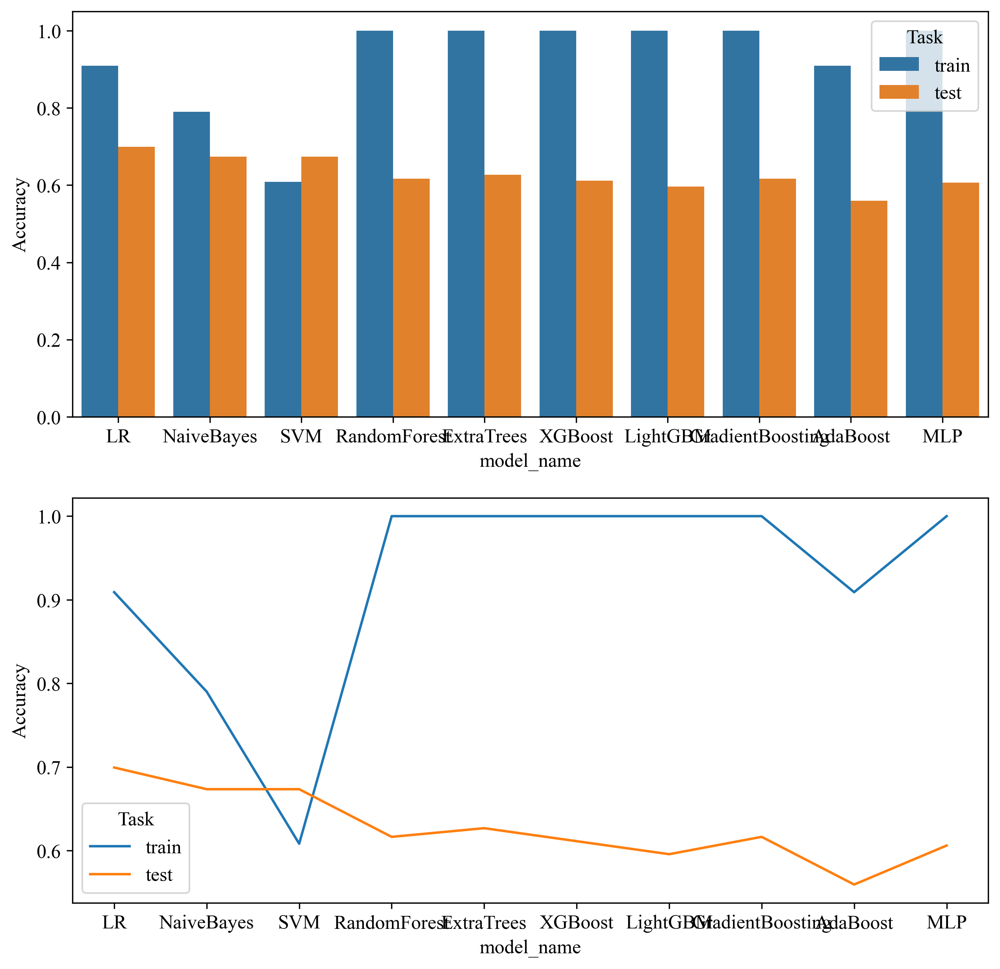

In [34]:
import seaborn as sns

plt.figure(figsize=(10, 10))
plt.subplot(211)
sns.barplot(x='model_name', y='Accuracy', data=metric, hue='Task')
plt.subplot(212)
sns.lineplot(x='model_name', y='Accuracy', data=metric, hue='Task')
plt.savefig(f'img/{task_type}model_acc.svg', bbox_inches = 'tight')

### 绘制ROC曲线
确定最好的模型，并且绘制曲线。

```python
def draw_roc(y_test, y_score, title='ROC', labels=None):
```

`sel_model = ['SVM', 'KNN']`参数为想要绘制的模型对应的参数。

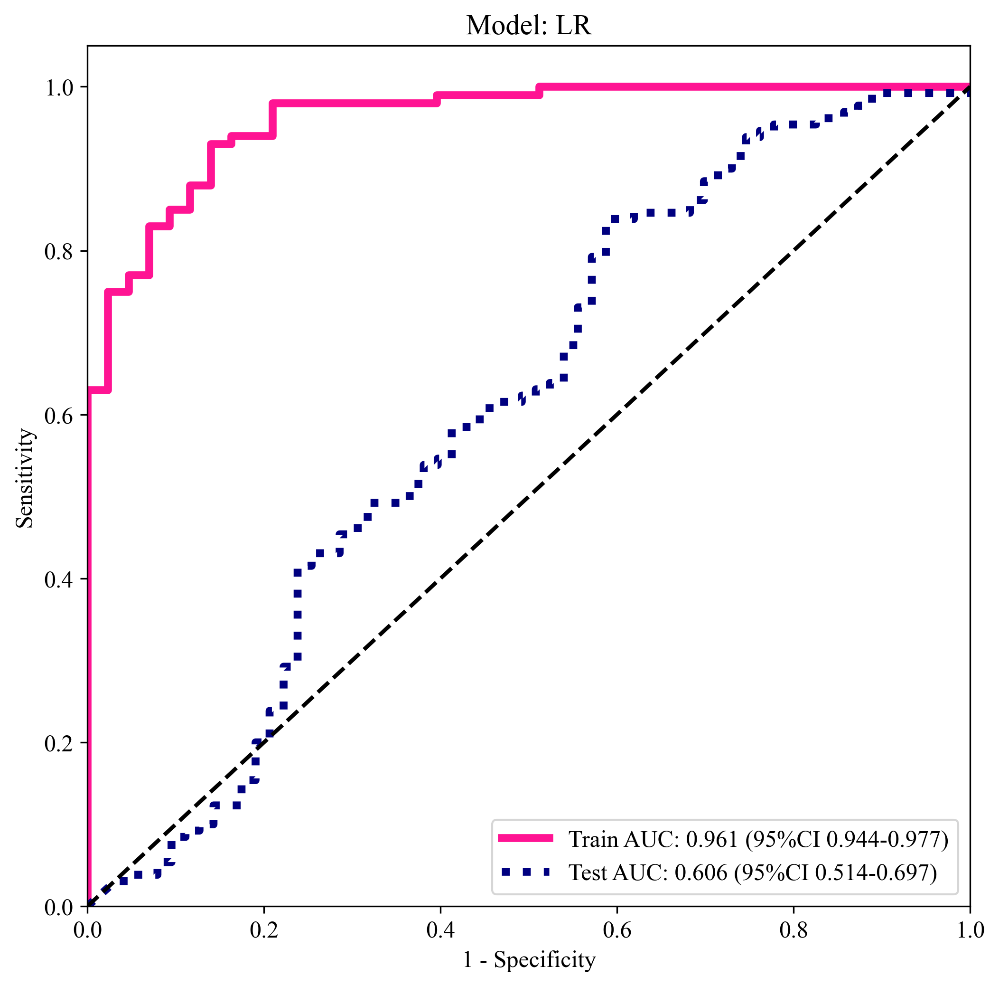

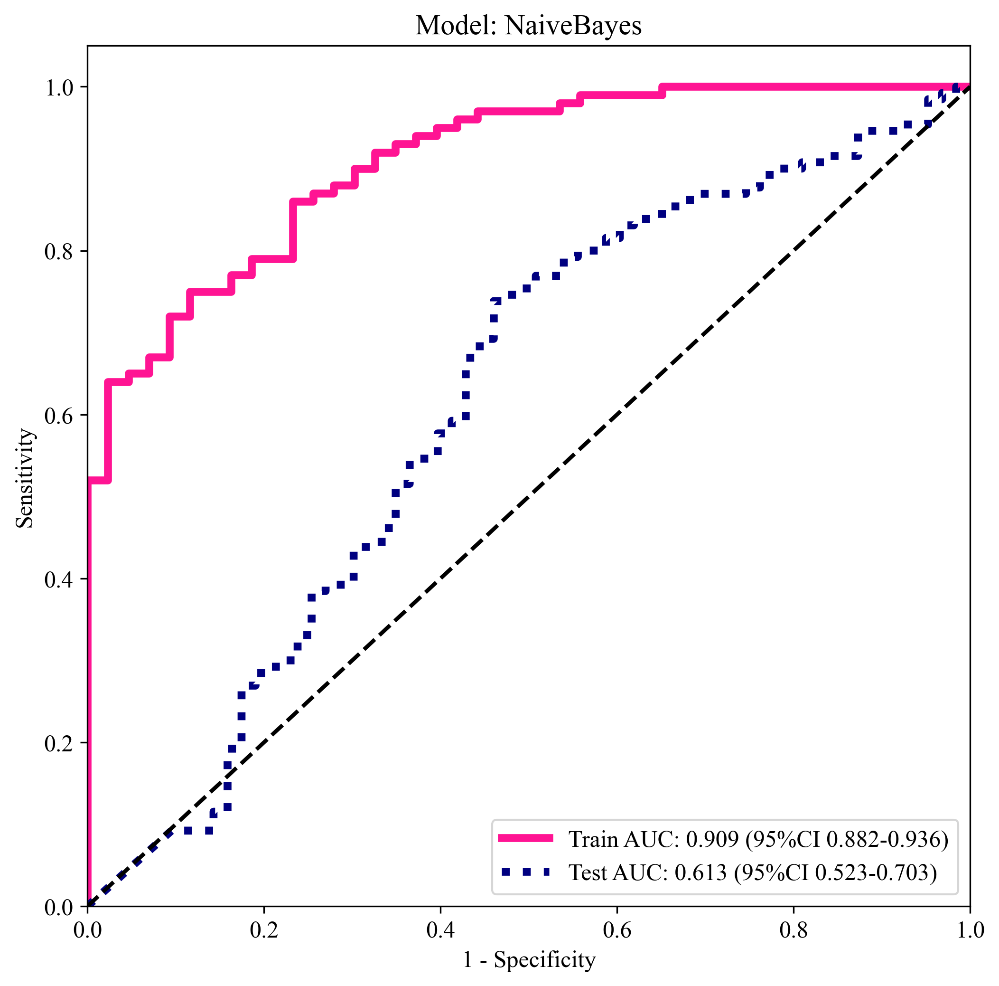

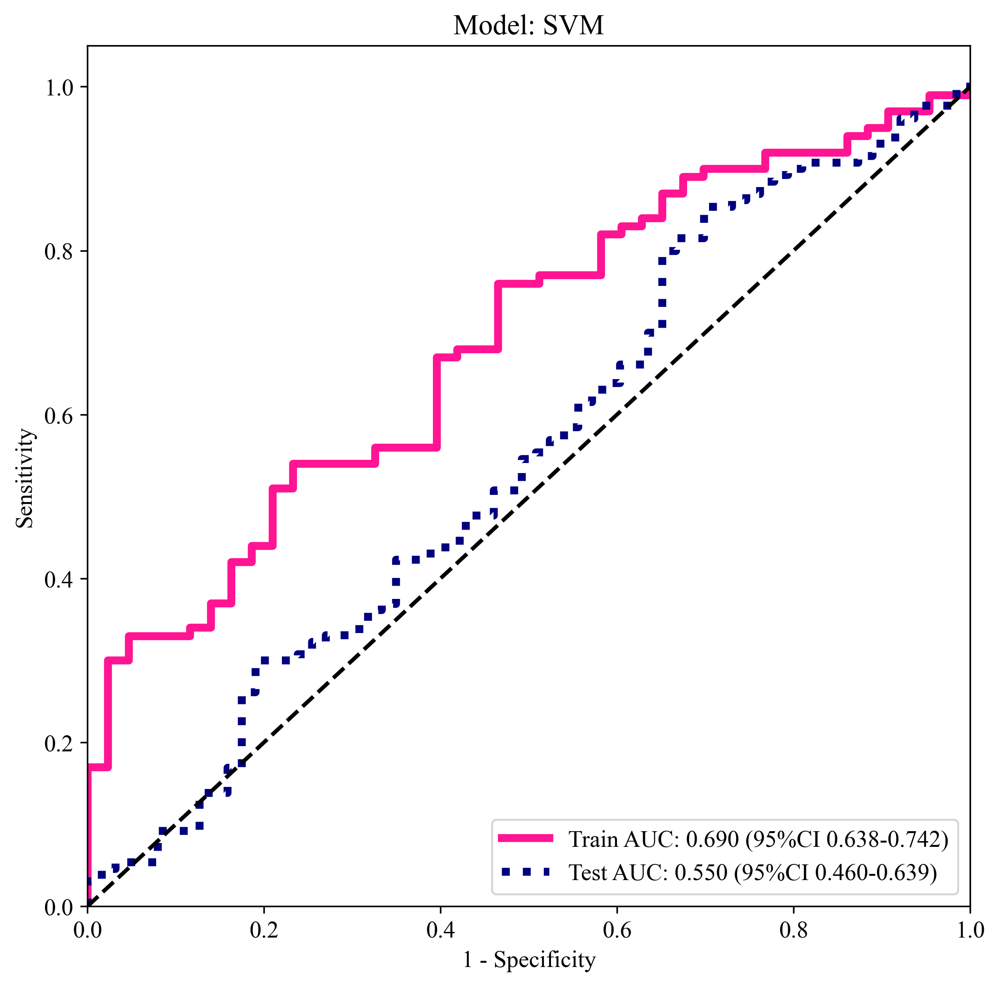

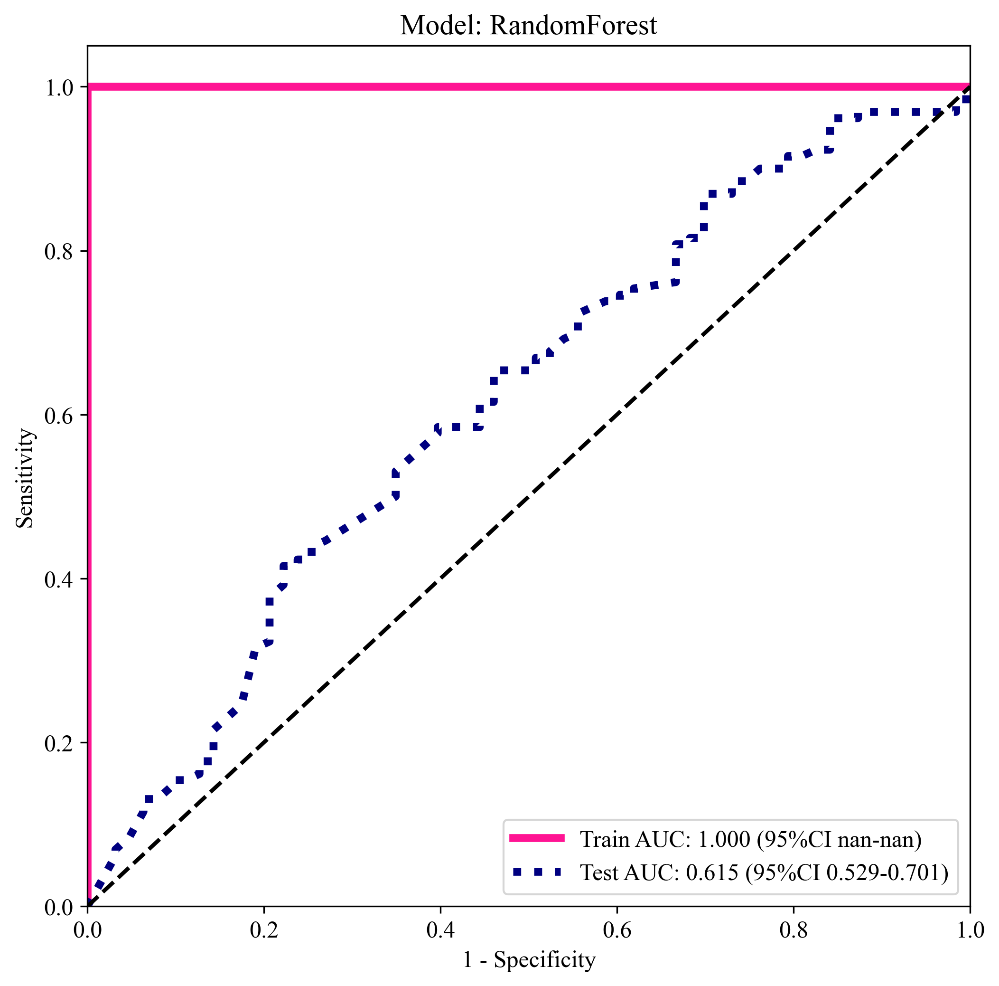

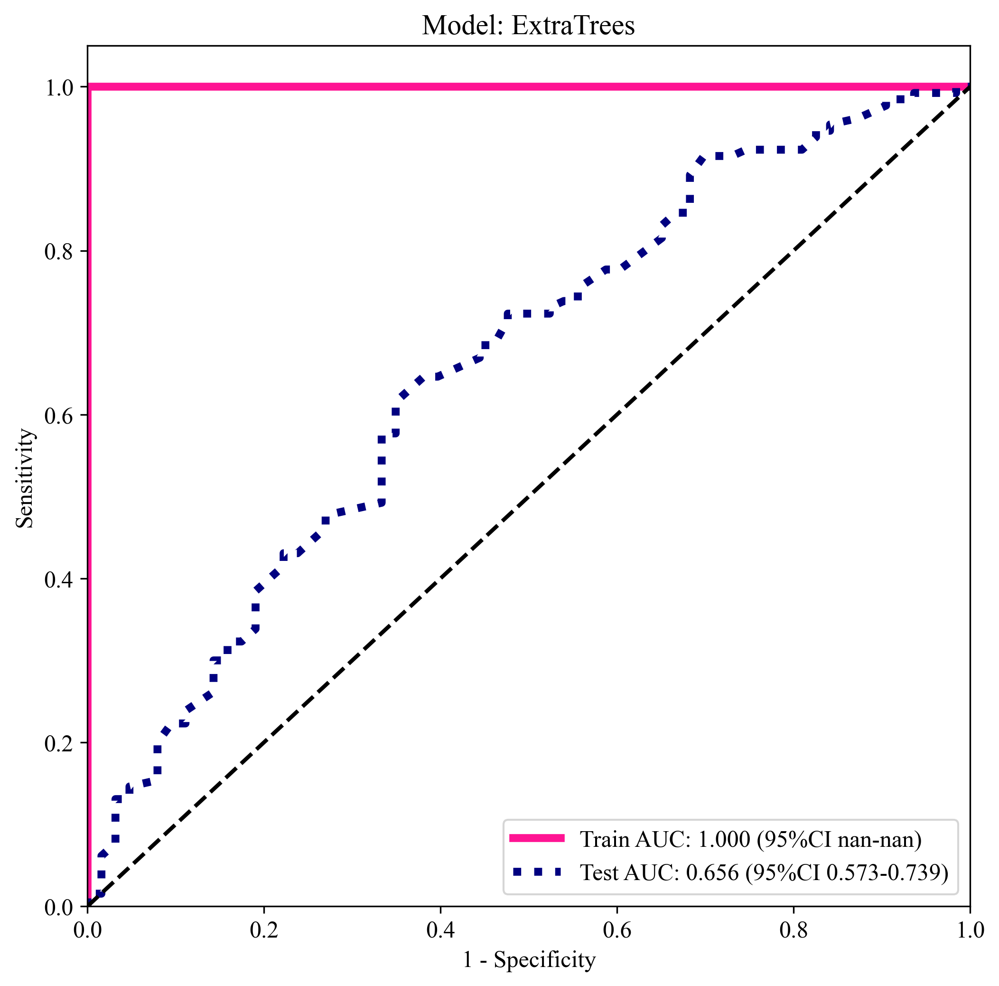

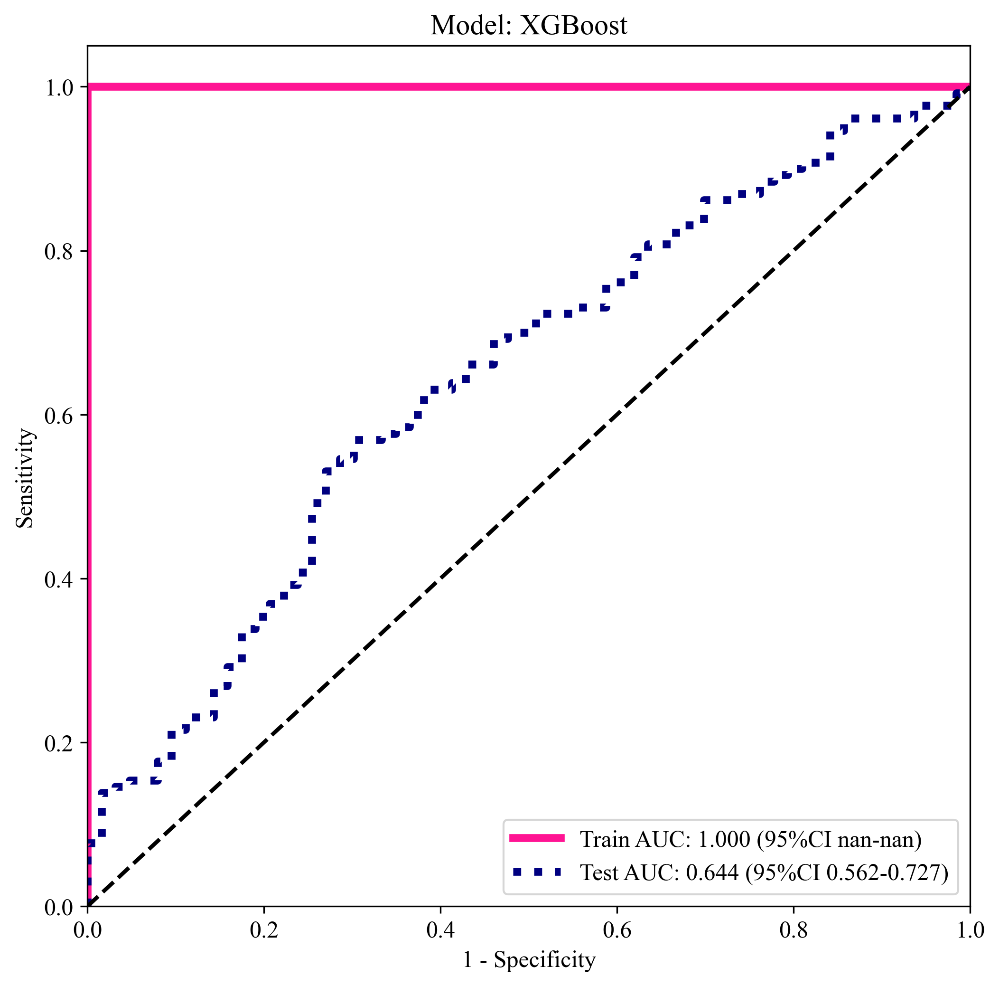

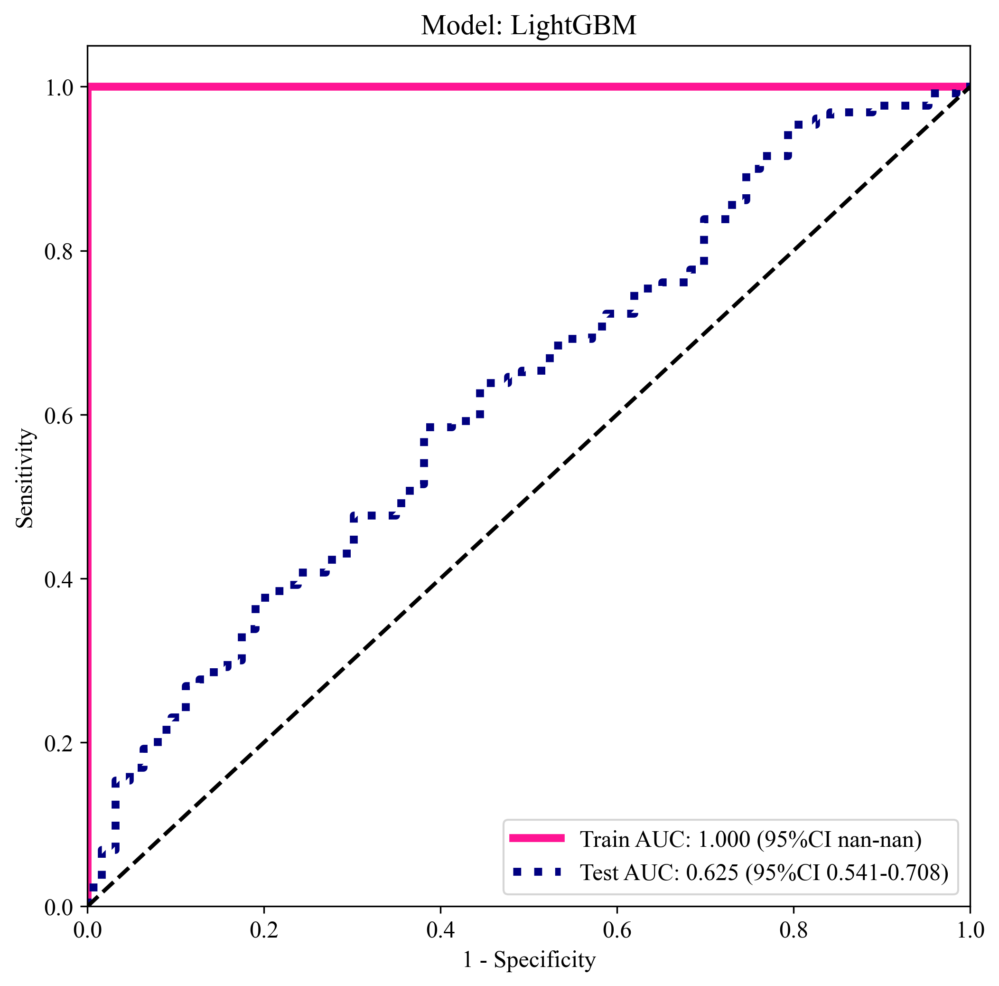

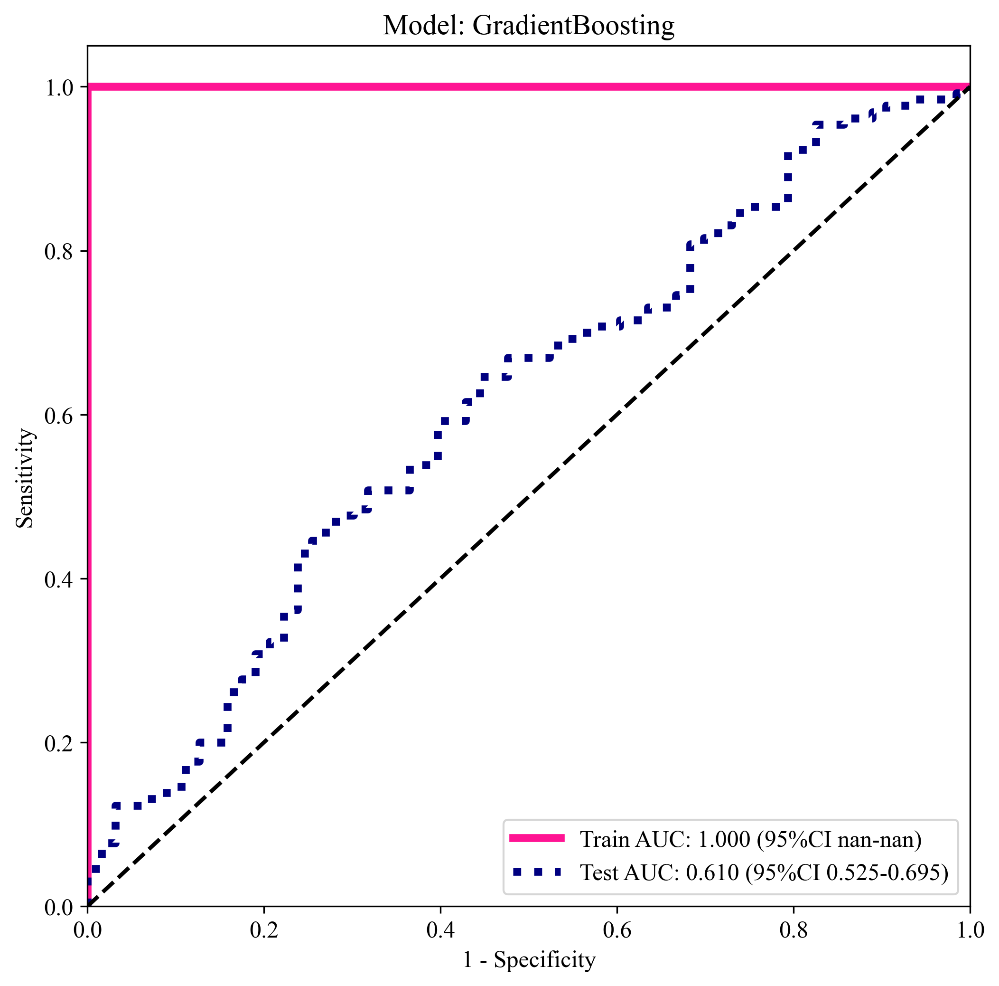

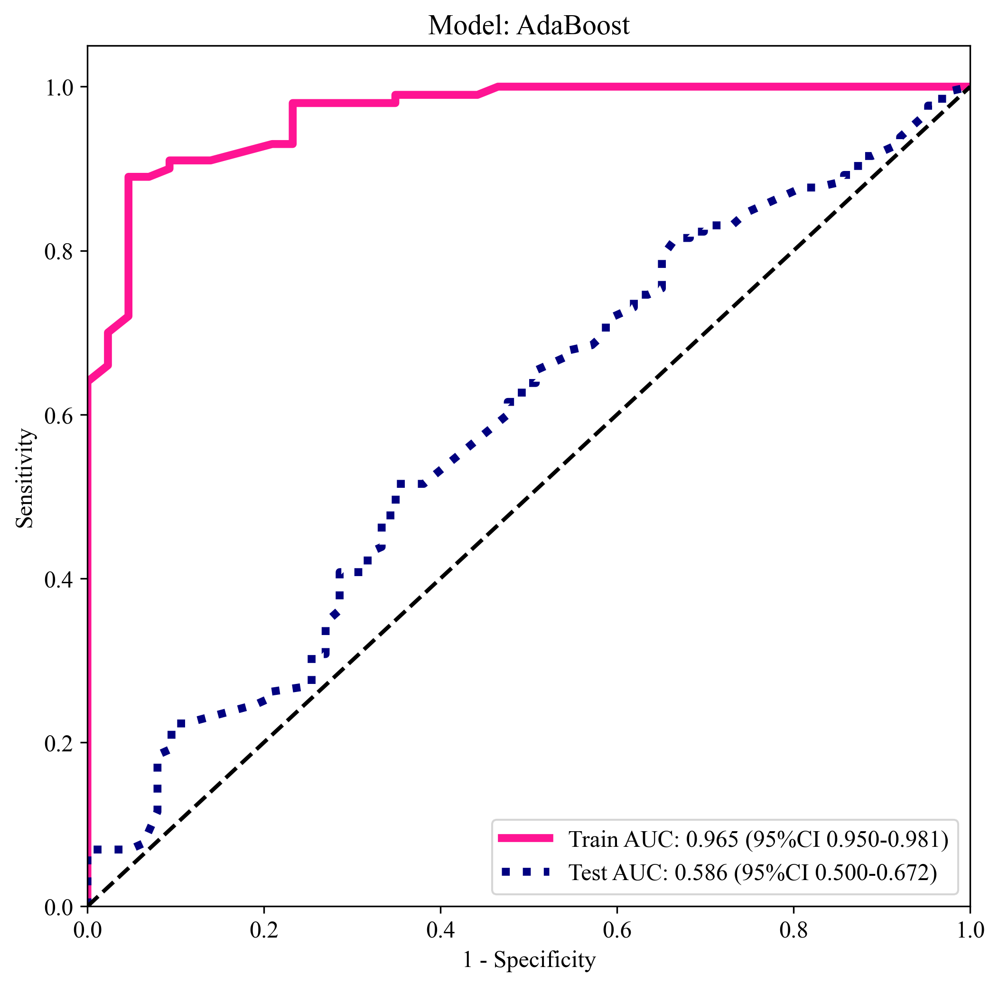

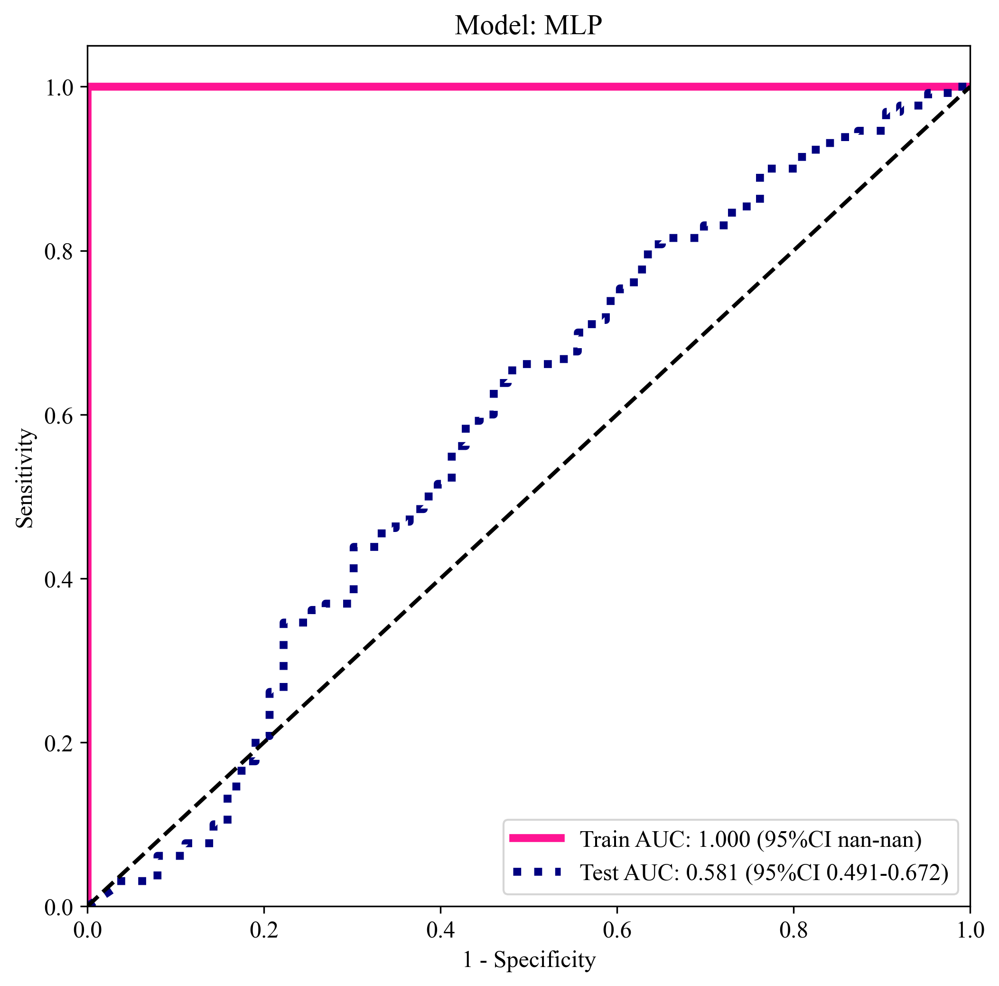

In [35]:
sel_model = model_names

for sm in sel_model:
    if sm in model_names:
        sel_model_idx = model_names.index(sm)
    
        # Plot all ROC curves
        plt.figure(figsize=(8, 8))
        for pred_score, label in zip(pred_scores, labels):
            okcomp.comp1.draw_roc([np.array(y_train_sel[label]), np.array(y_test_sel[label])], 
                                  pred_score[sel_model_idx], 
                                  labels=['Train', 'Test'], title=f"Model: {sm}")
            plt.savefig(f'img/{task_type}model_{sm}_roc.svg', bbox_inches = 'tight')

#### 汇总所有模型

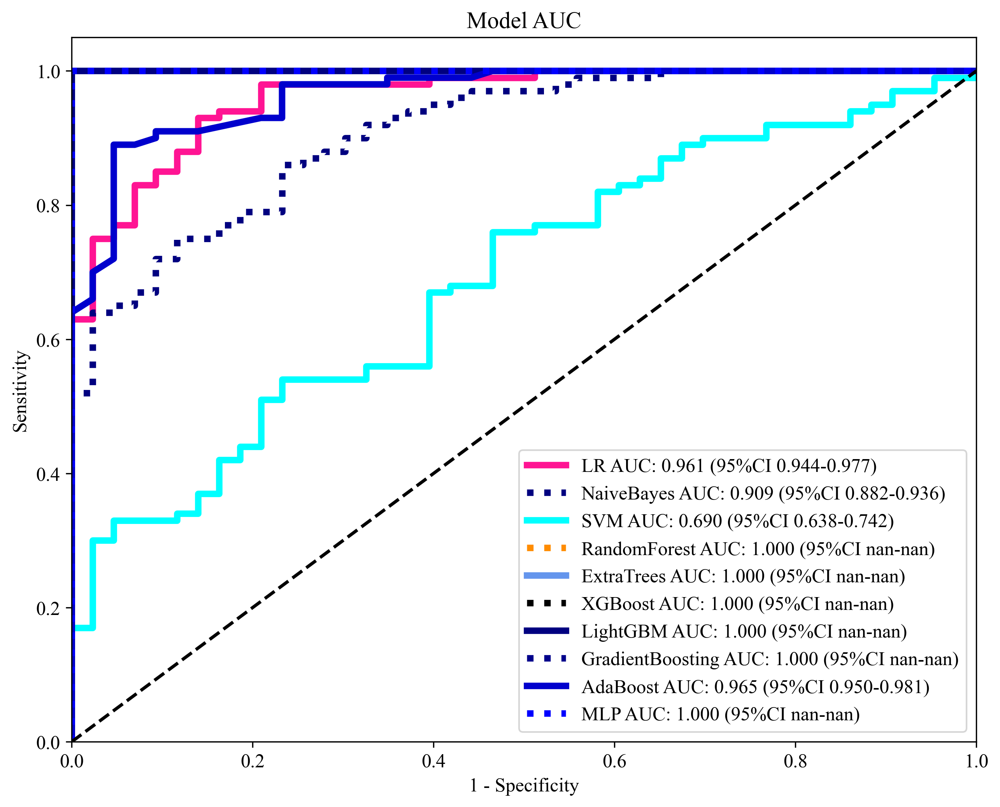

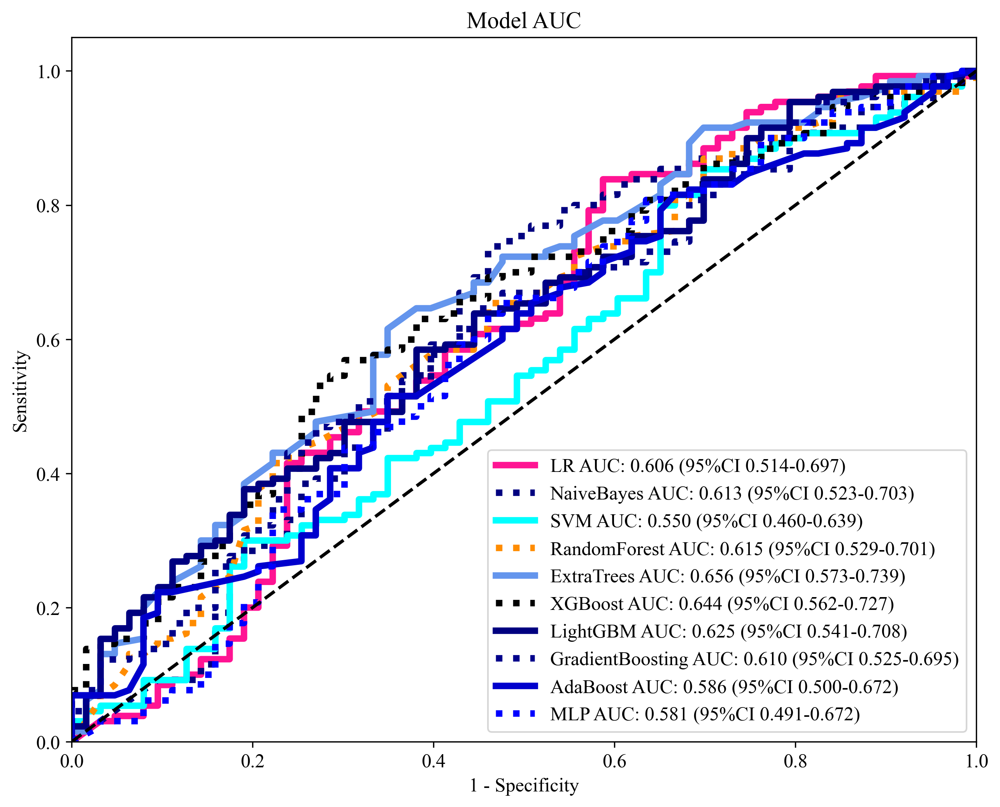

In [36]:
sel_model = model_names

for pred_score, label in zip(pred_scores, labels):
    pred_test_scores = []
    for sm in sel_model:
        if sm in model_names:
            sel_model_idx = model_names.index(sm)
            pred_test_scores.append(pred_score[sel_model_idx][0])
    okcomp.comp1.draw_roc([np.array(y_train_sel[label])] * len(pred_test_scores), 
                          pred_test_scores, 
                          labels=sel_model, title=f"Model AUC")
    plt.savefig(f'img/{task_type}model_roc_train.svg', bbox_inches = 'tight')
    plt.show()

for pred_score, label in zip(pred_scores, labels):
    pred_test_scores = []
    for sm in sel_model:
        if sm in model_names:
            sel_model_idx = model_names.index(sm)
            pred_test_scores.append(pred_score[sel_model_idx][1])
    okcomp.comp1.draw_roc([np.array(y_test_sel[label])] * len(pred_test_scores), 
                          pred_test_scores, 
                          labels=sel_model, title=f"Model AUC")
    plt.savefig(f'img/{task_type}model_roc_test.svg', bbox_inches = 'tight')

### DCA 决策曲线

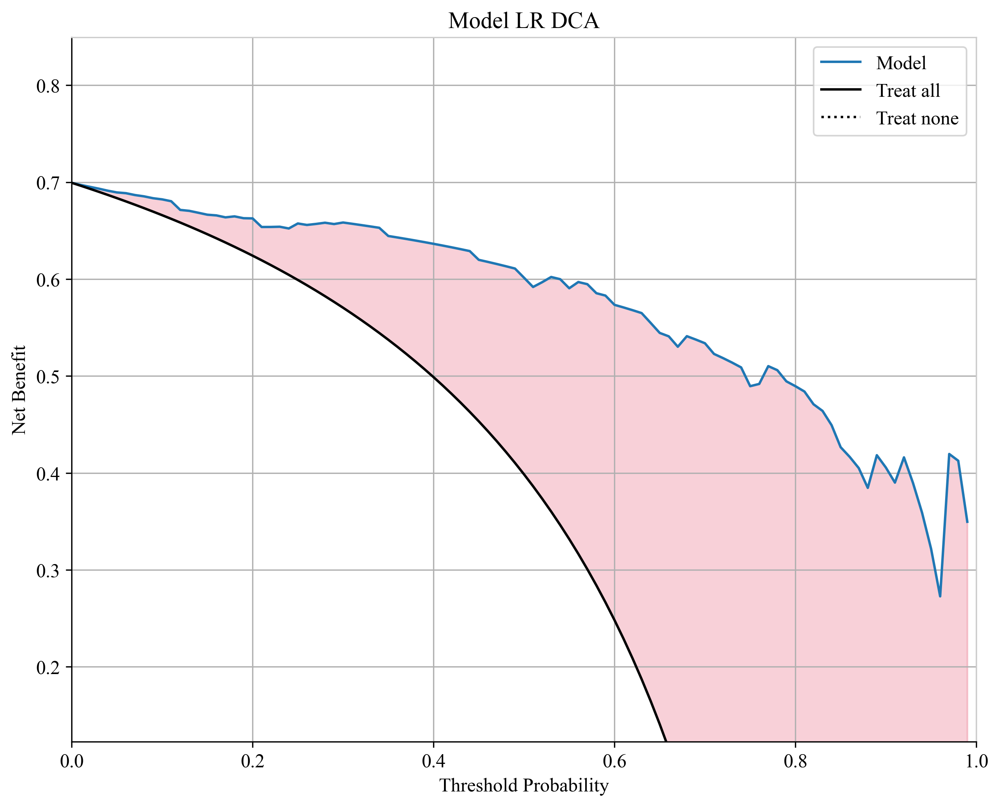

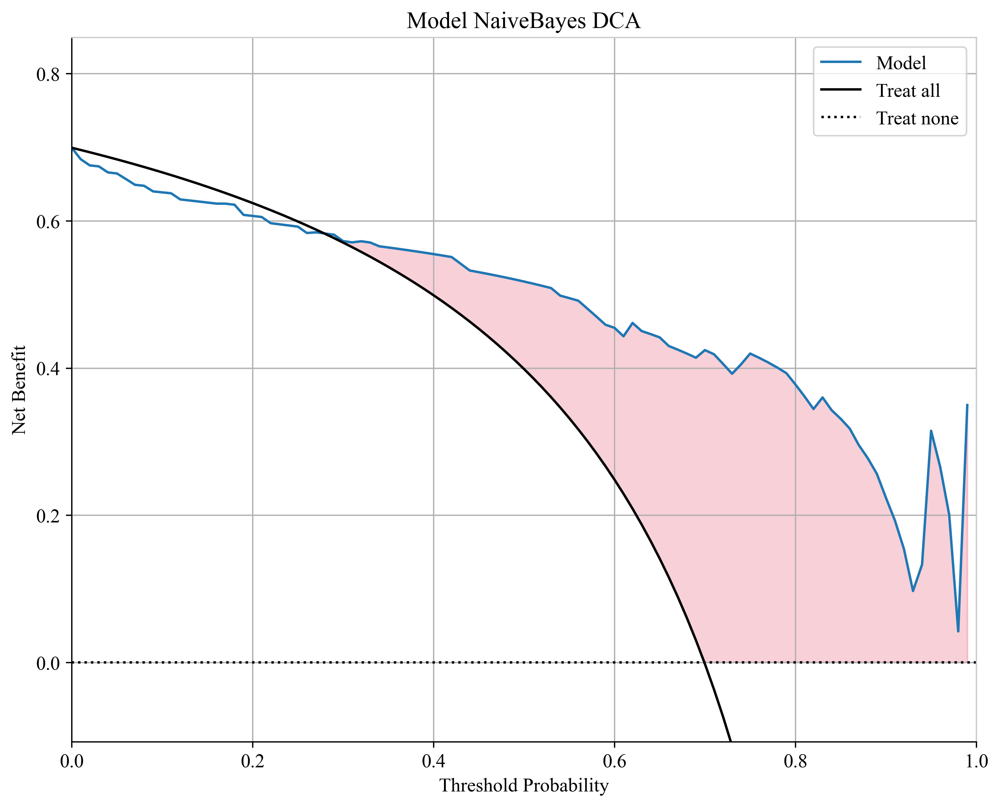

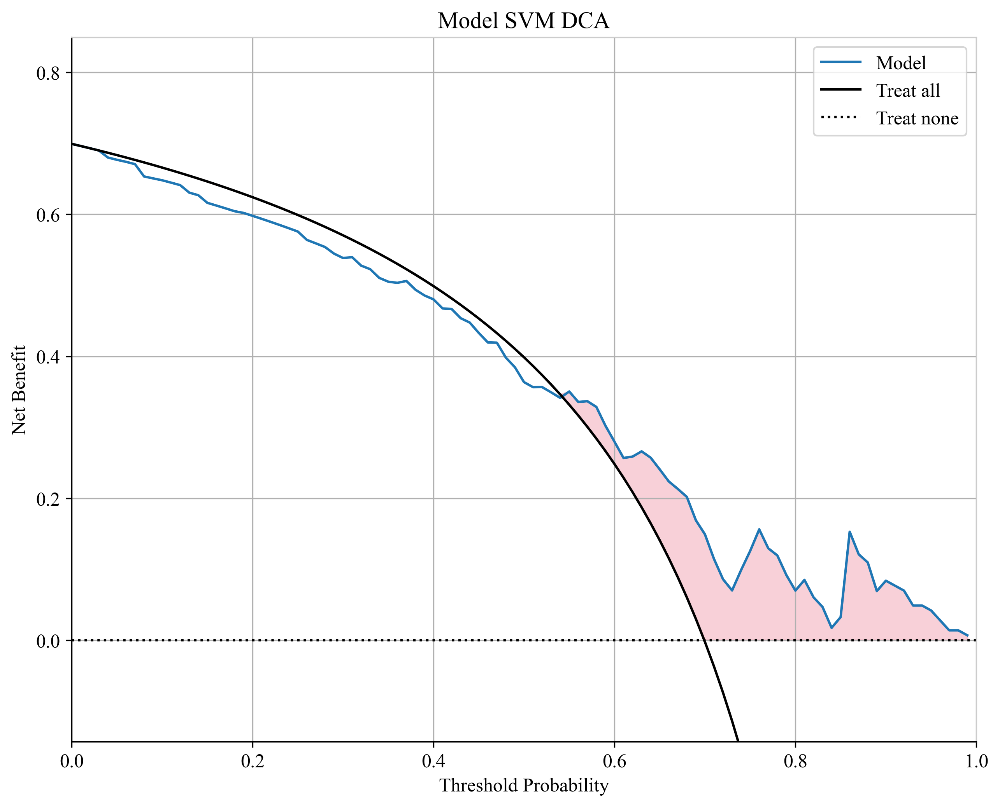

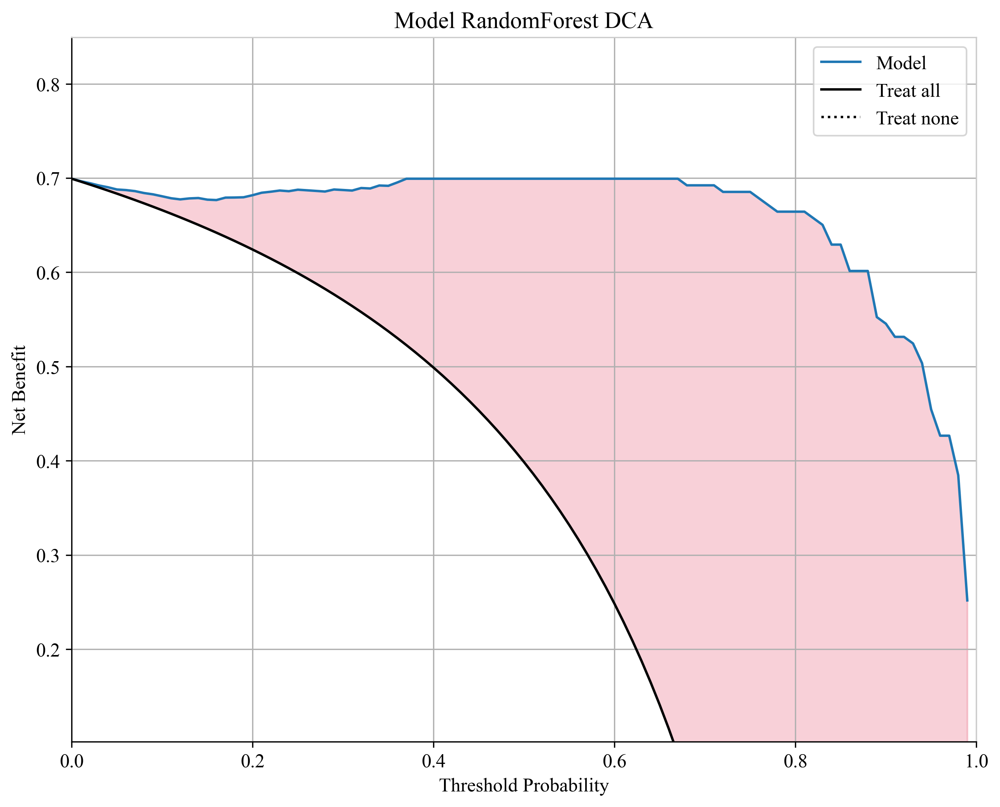

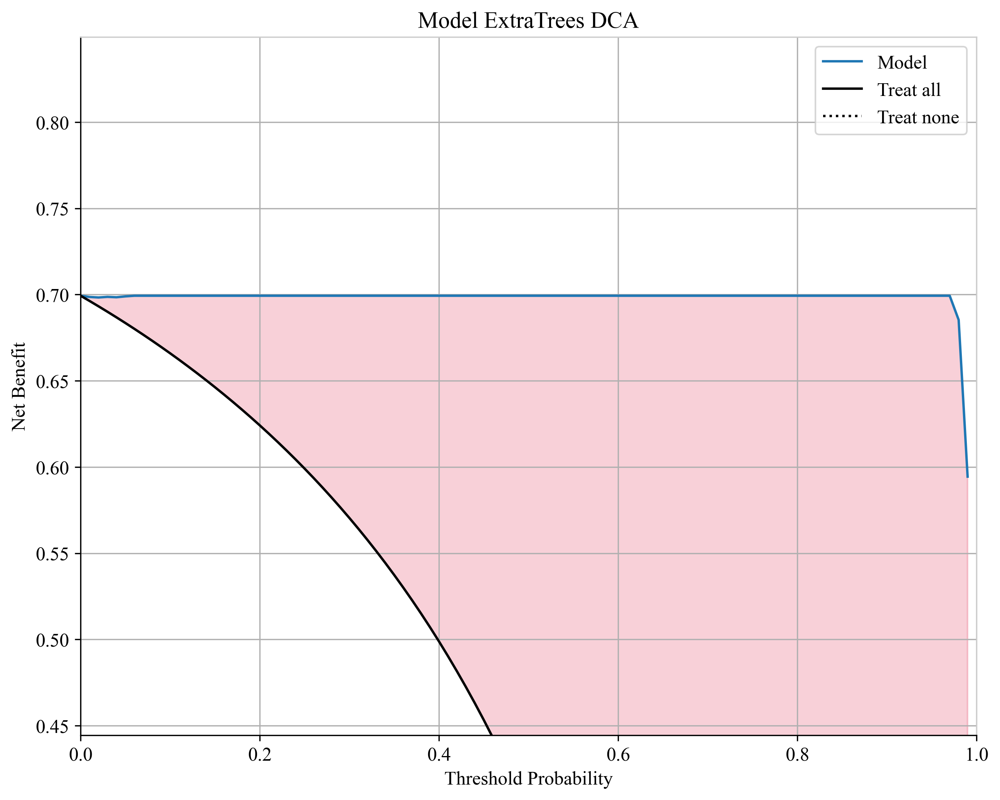

...

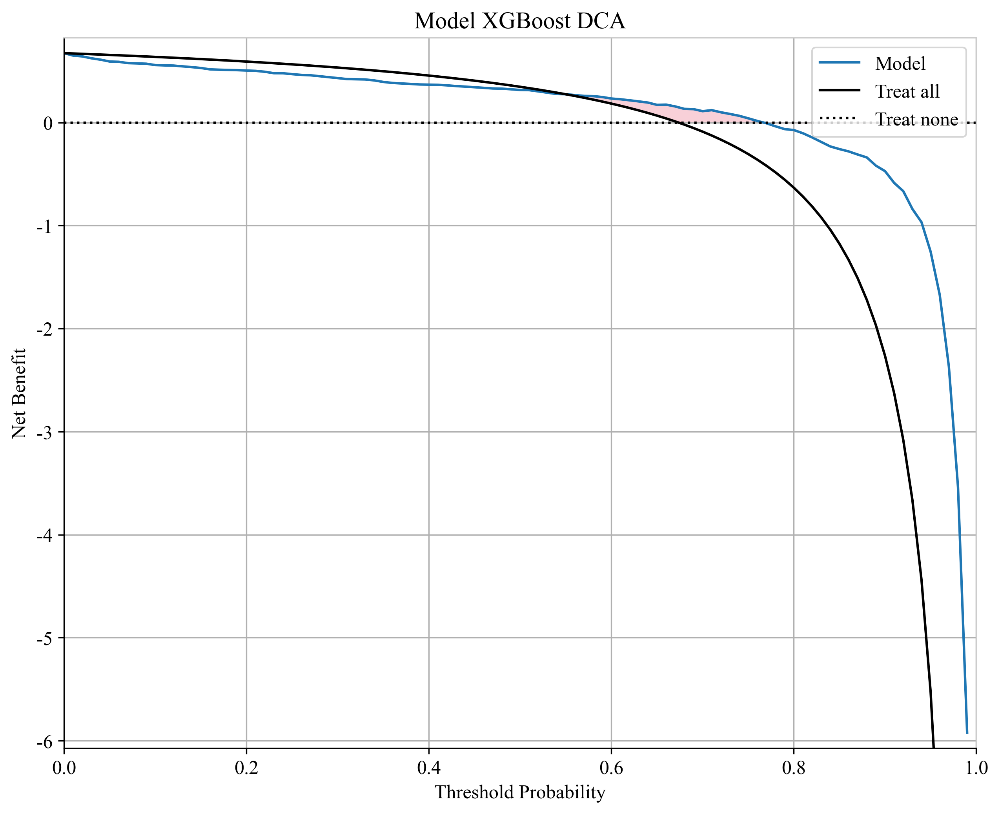

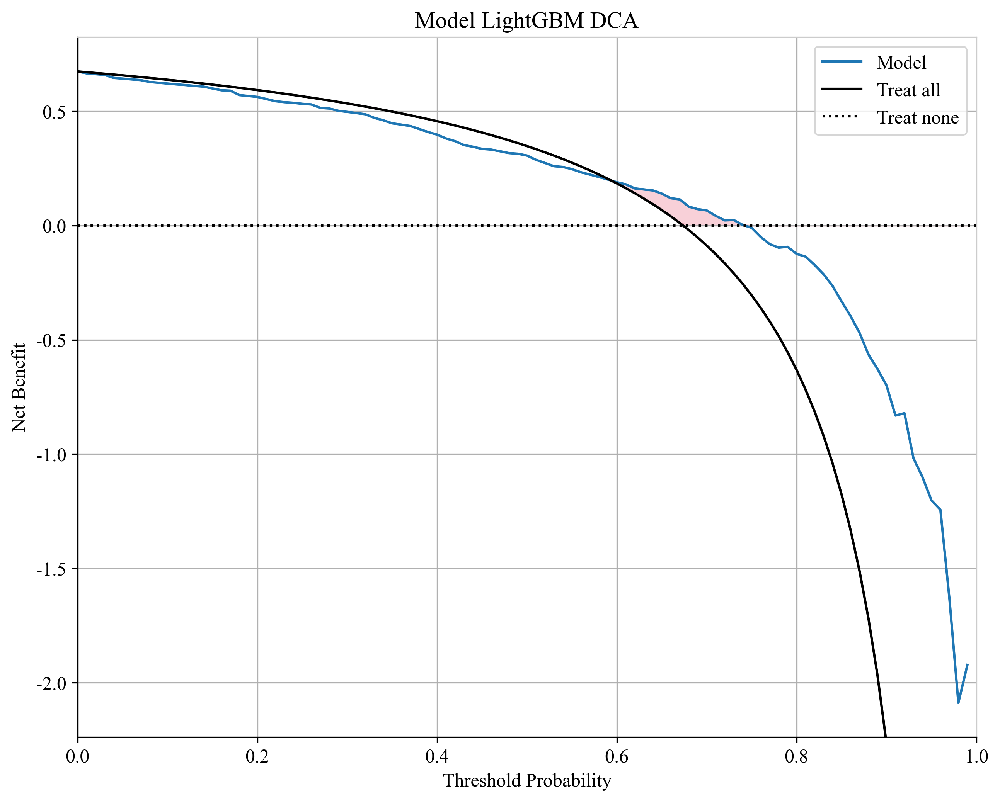

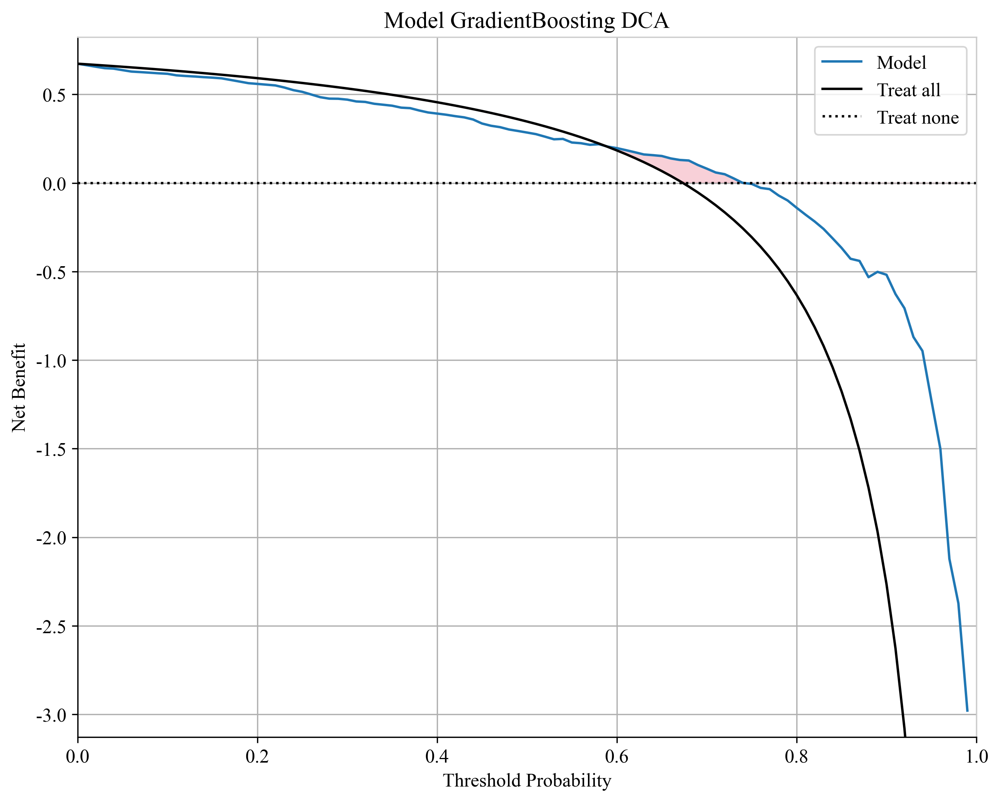

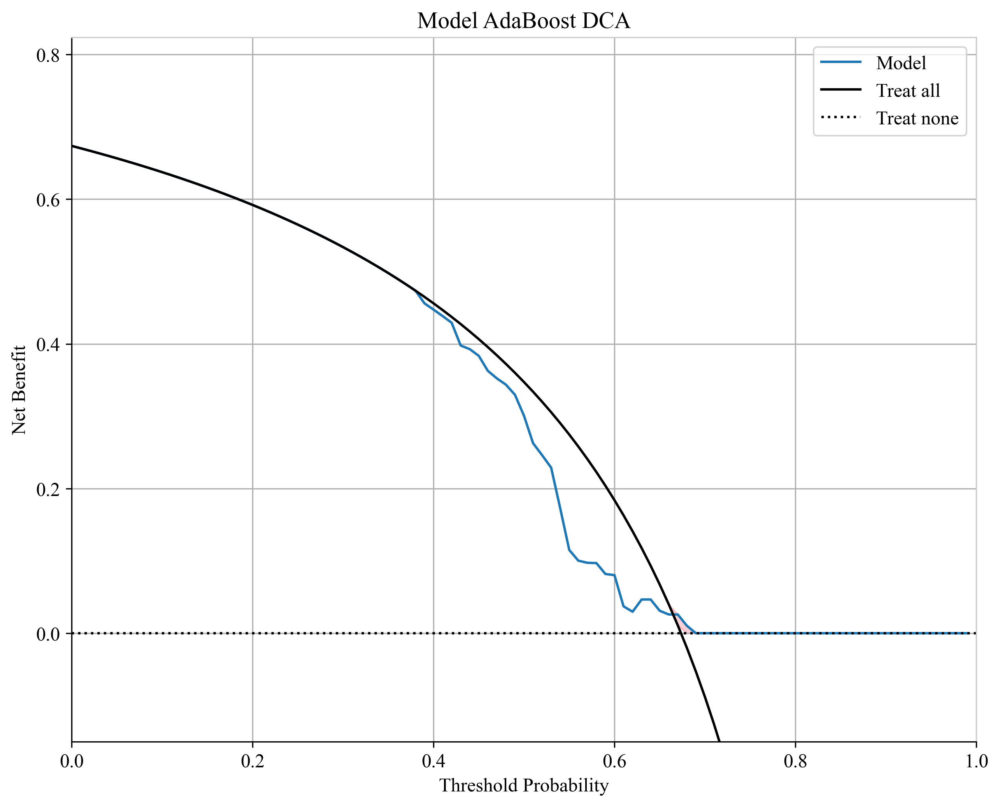

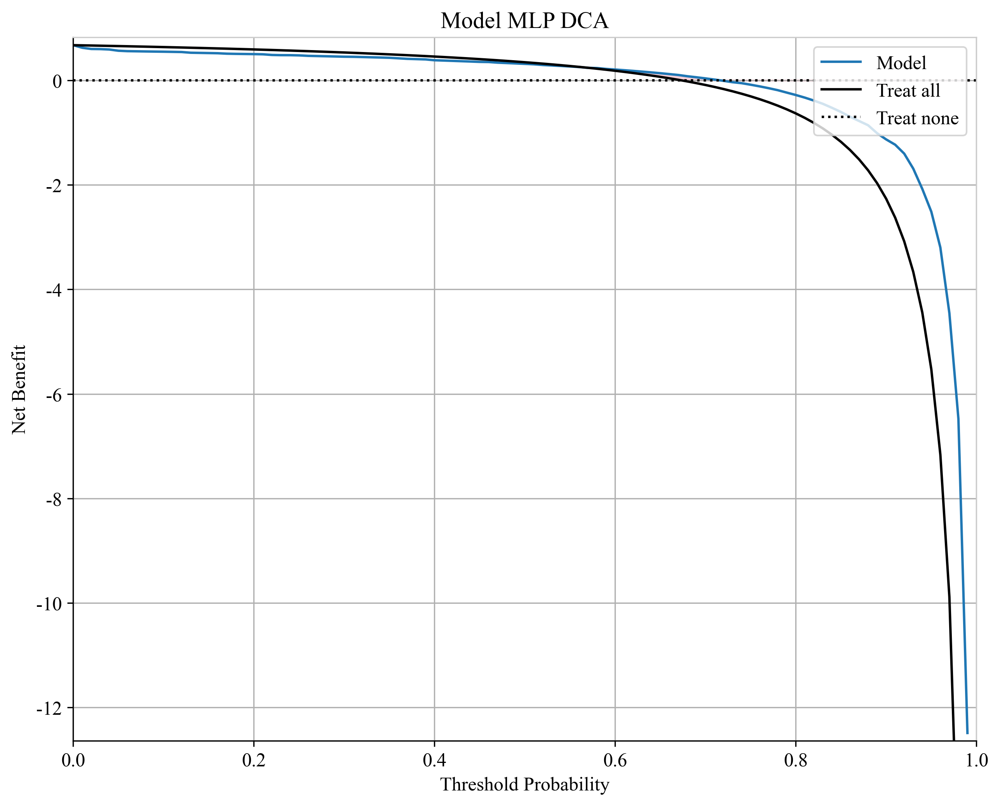

In [37]:
from onekey_algo.custom.components.comp1 import plot_DCA

for pred_score, label in zip(pred_scores, labels):
    pred_test_scores = []
    for sm in sel_model:
        if sm in model_names:
            sel_model_idx = model_names.index(sm)
            okcomp.comp1.plot_DCA(pred_score[sel_model_idx][0][:,1], np.array(y_train_sel[label]),
                                  title=f'Model {sm} DCA')
            plt.savefig(f'img/{task_type}model_{sm}_dca_train.svg', bbox_inches = 'tight')
            plt.show()

for pred_score, label in zip(pred_scores, labels):
    pred_test_scores = []
    for sm in sel_model:
        if sm in model_names:
            sel_model_idx = model_names.index(sm)
            okcomp.comp1.plot_DCA(pred_score[sel_model_idx][1][:,1], np.array(y_test_sel[label]),
                                  title=f'Model {sm} DCA')
            plt.savefig(f'img/{task_type}model_{sm}_dca_test.svg', bbox_inches = 'tight')

### 绘制混淆矩阵

绘制混淆矩阵，[混淆矩阵解释](https://baike.baidu.com/item/%E6%B7%B7%E6%B7%86%E7%9F%A9%E9%98%B5/10087822?fr=aladdin)
`sel_model = ['SVM', 'KNN']`参数为想要绘制的模型对应的参数。

如果需要修改标签到名称的映射，修改`class_mapping={1:'1', 0:'0'}`

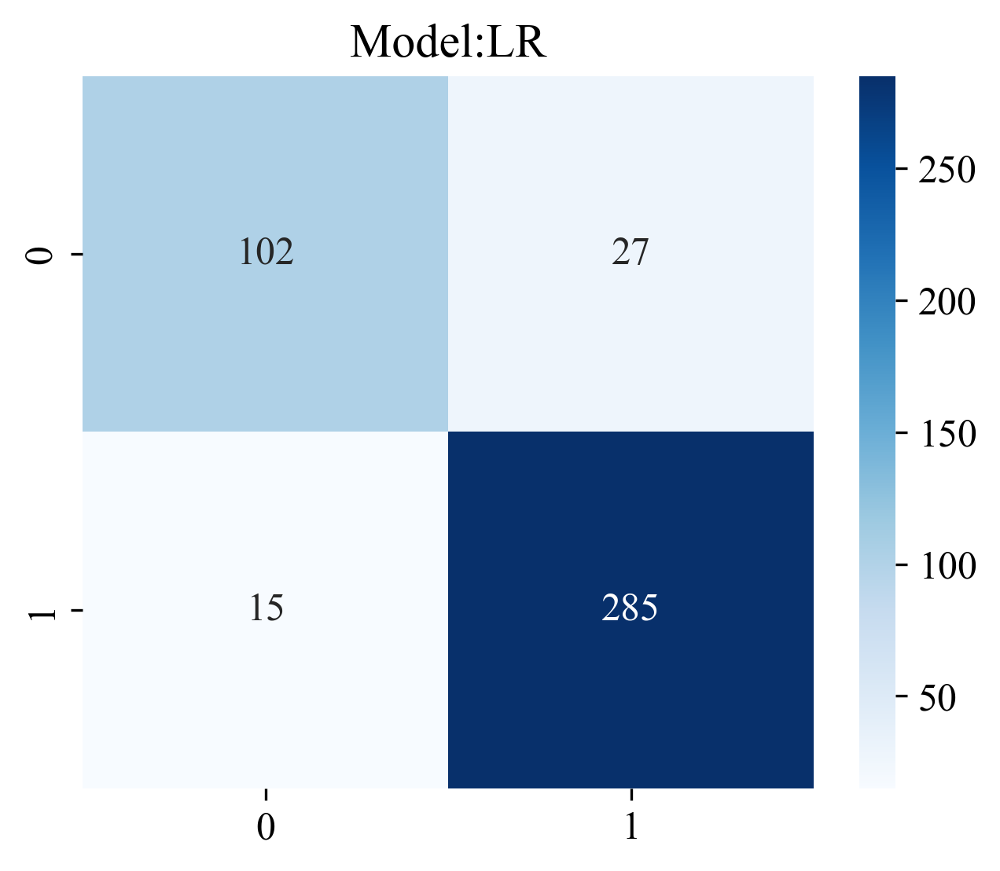

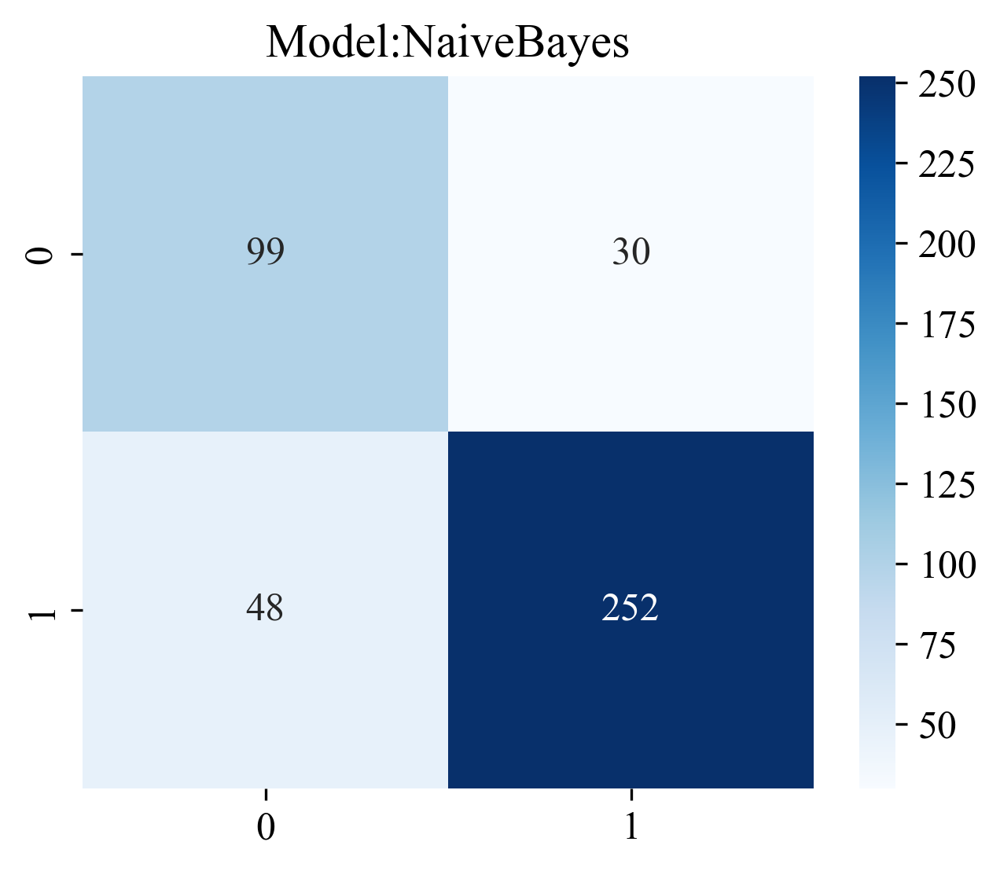

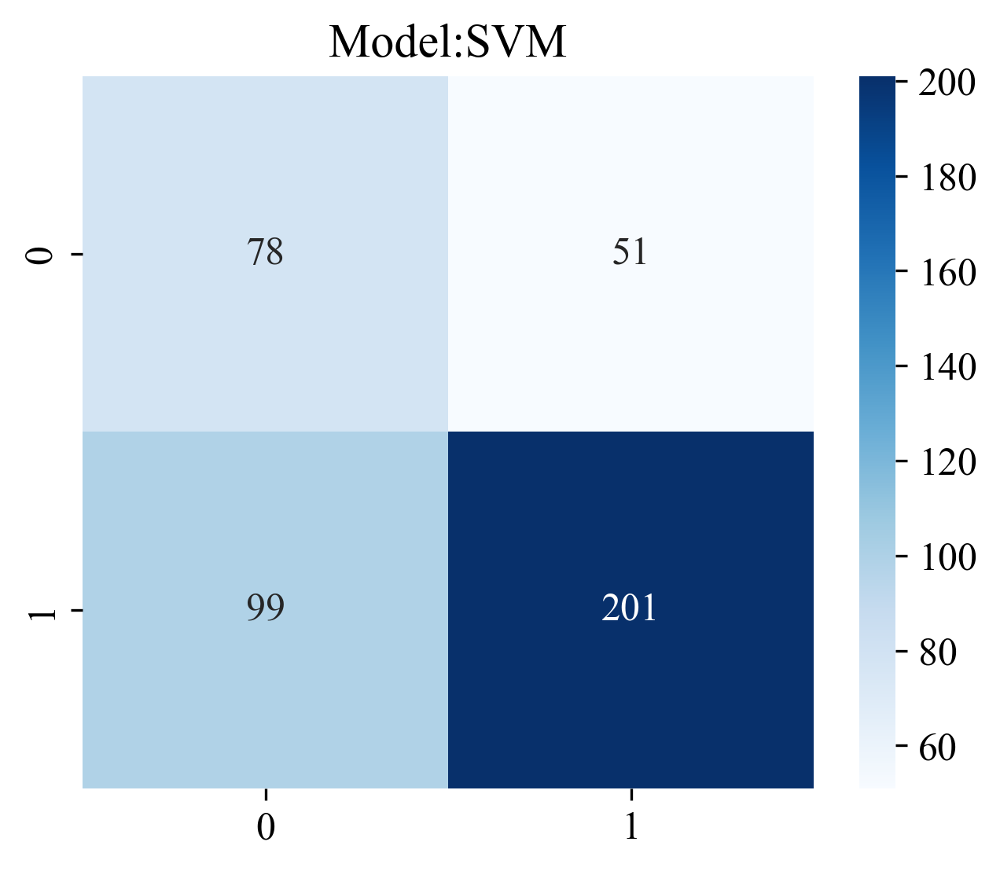

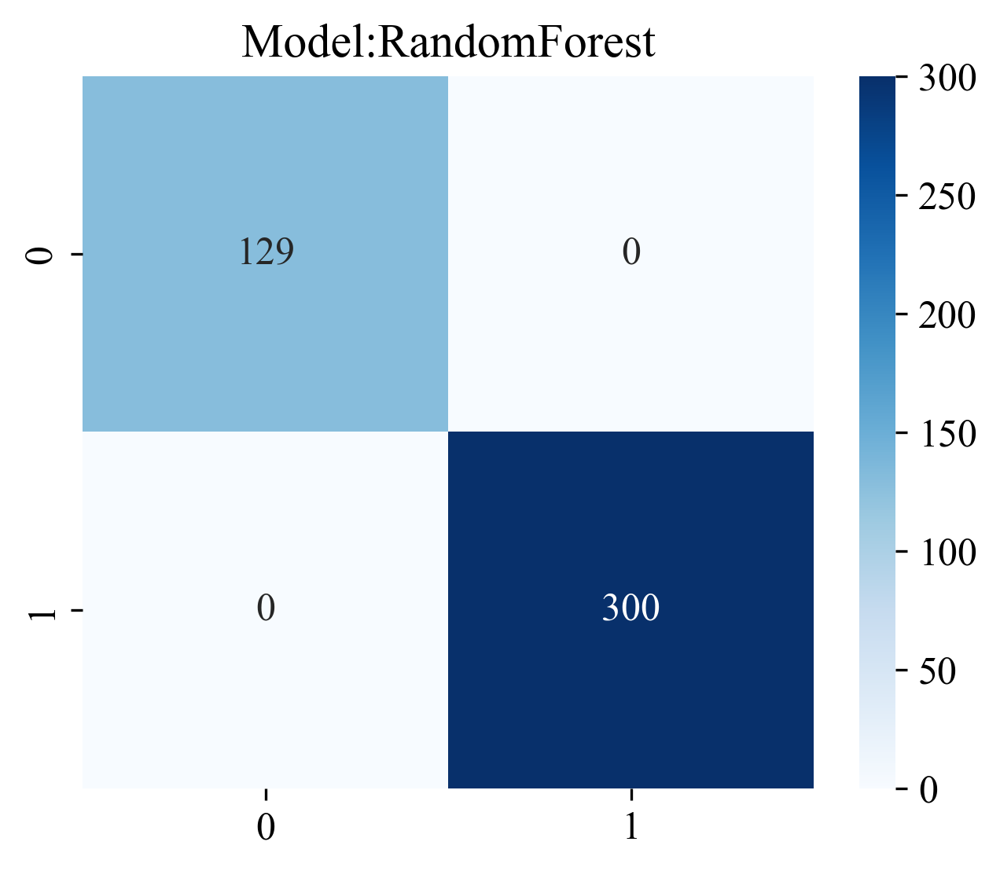

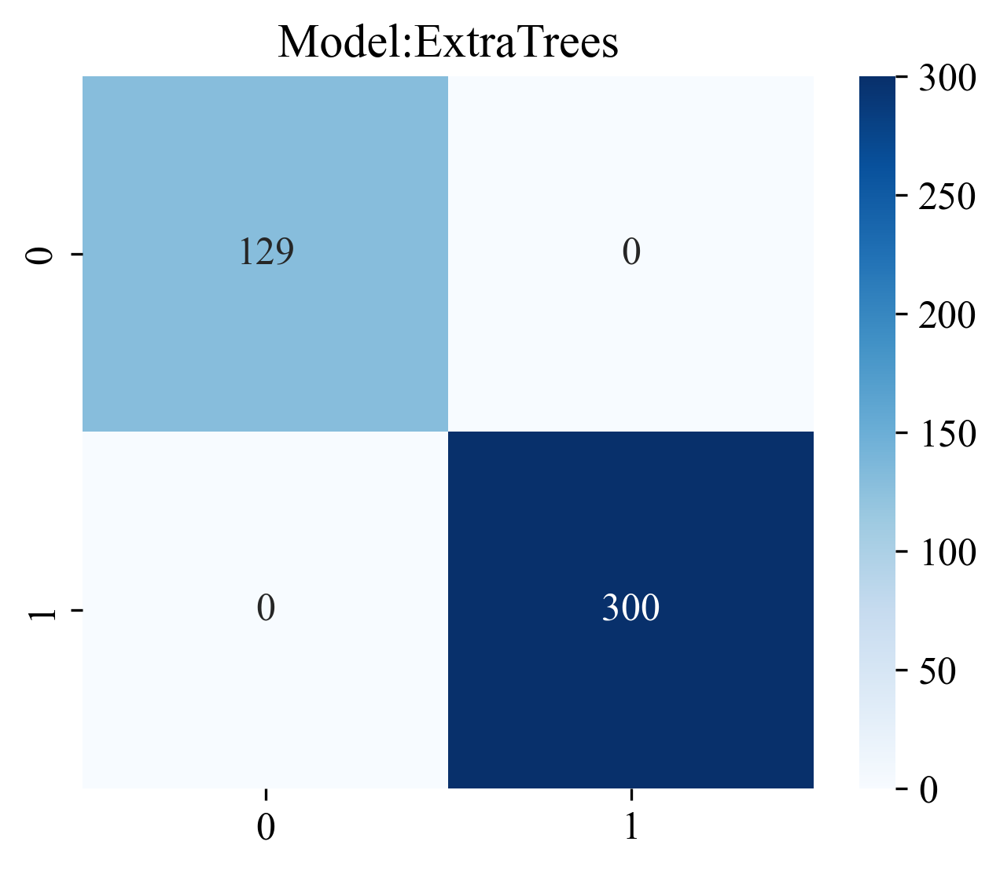

...

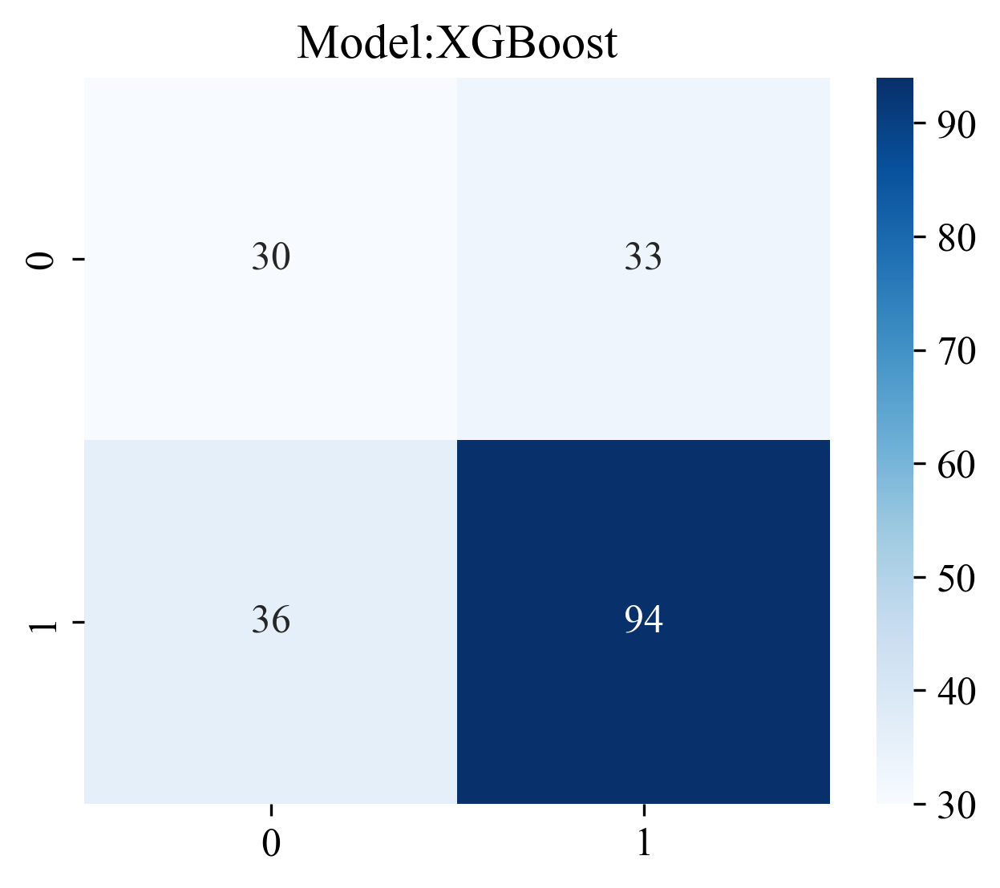

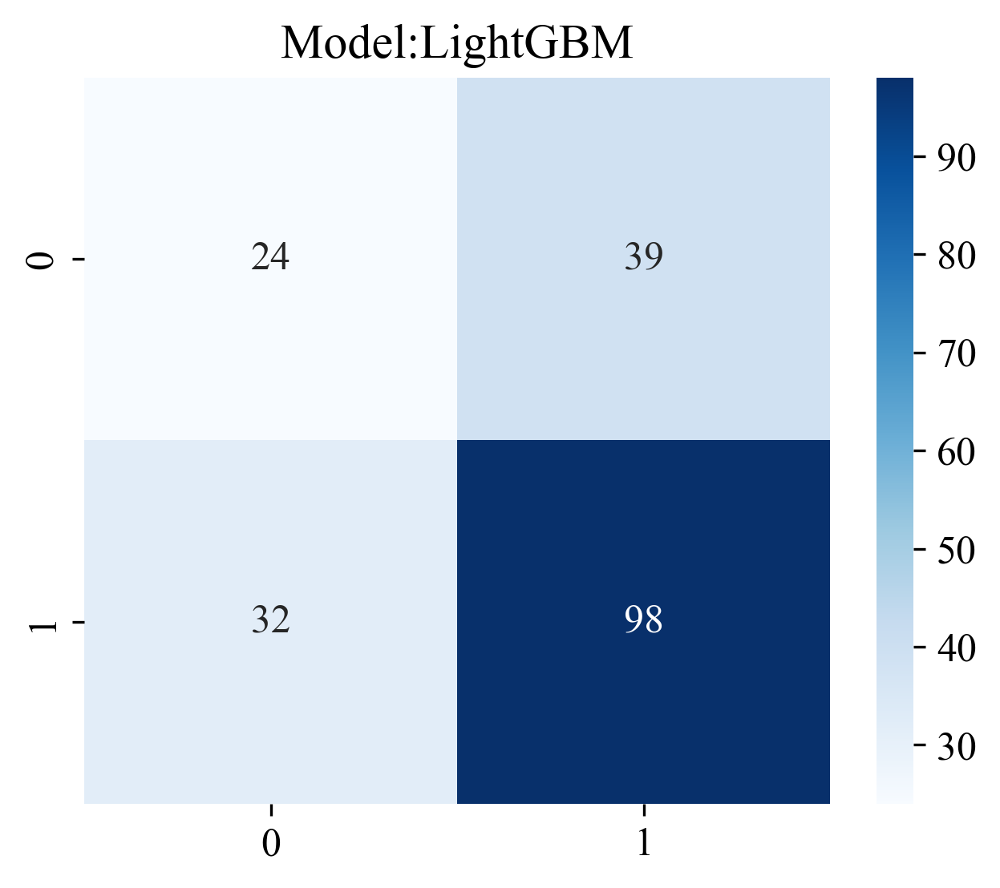

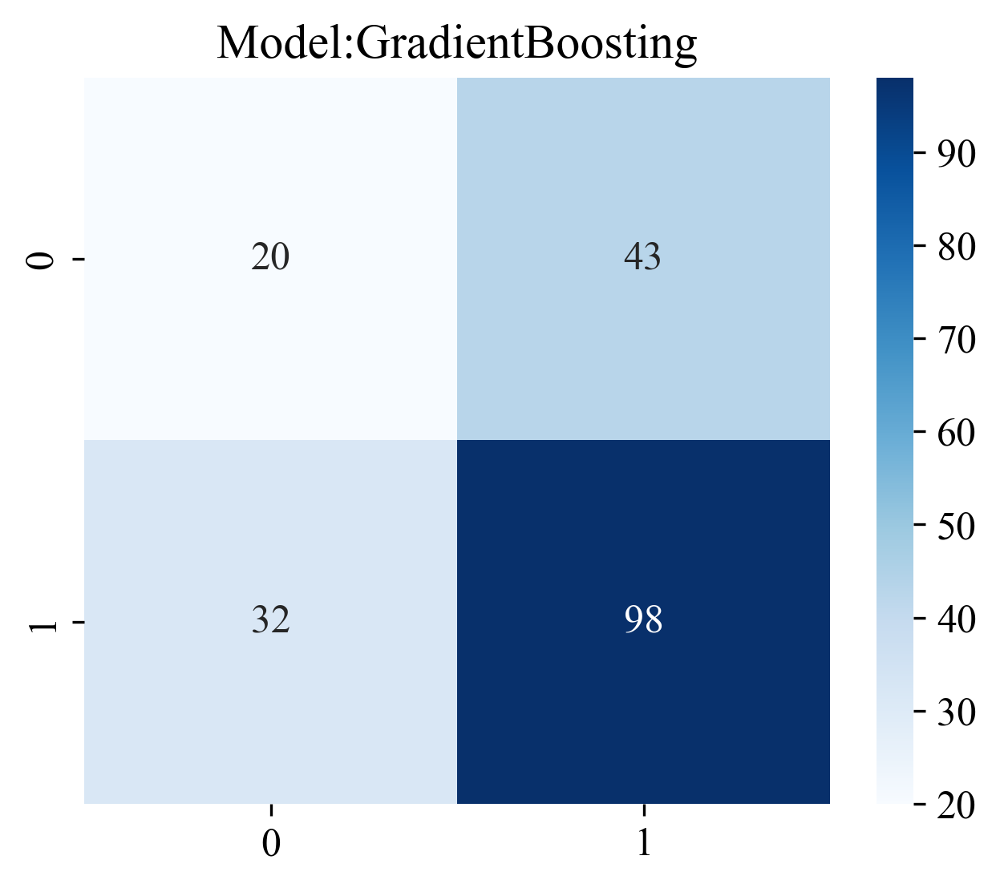

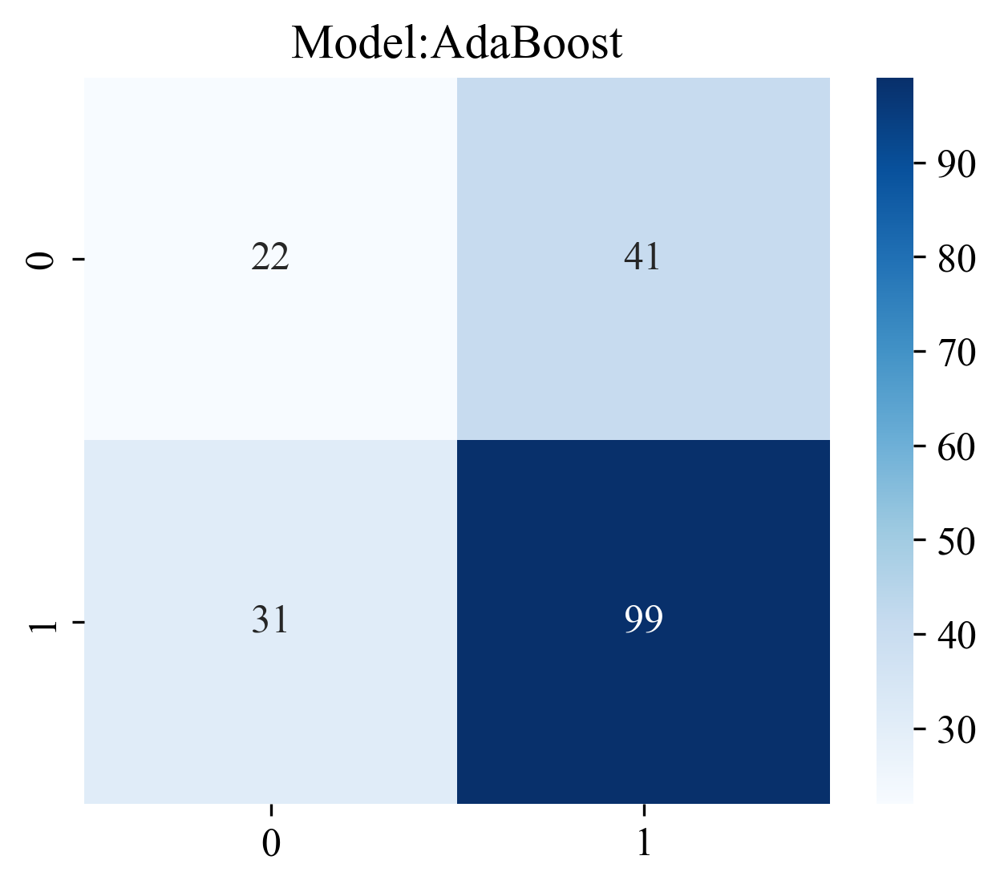

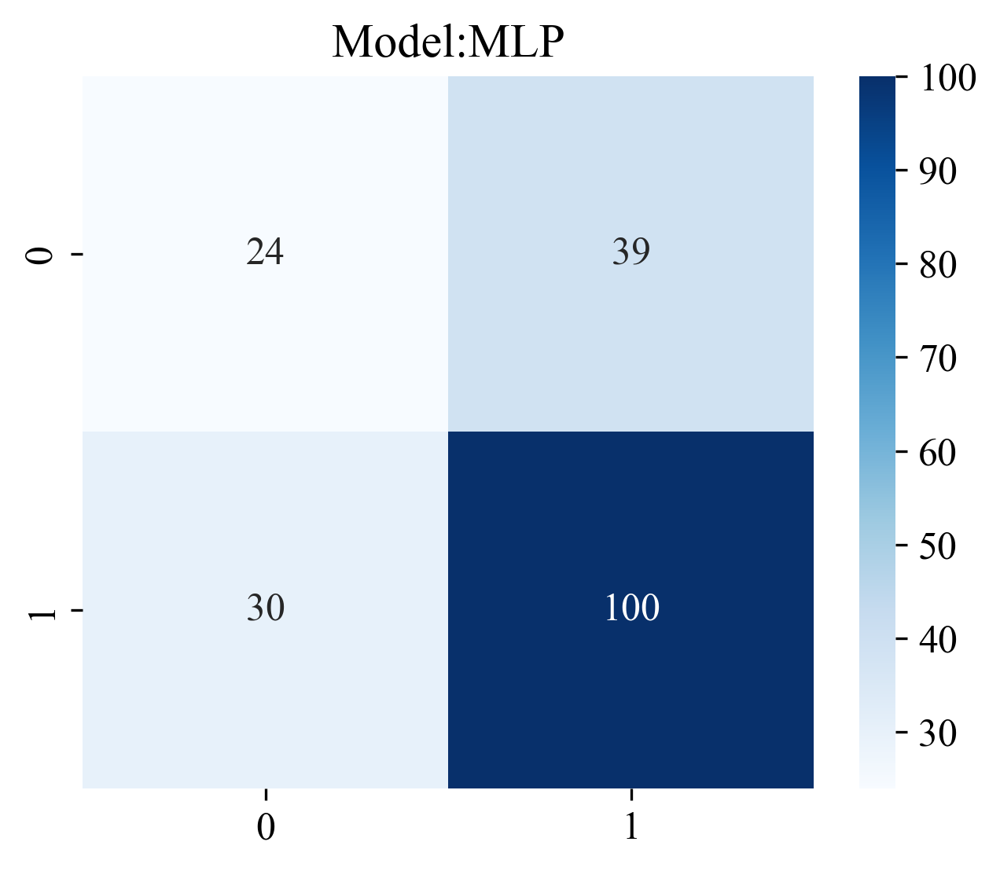

In [38]:
# 设置绘制参数
sel_model = model_names
c_matrix = {}

for sm in sel_model:
    if sm in model_names:
        sel_model_idx = model_names.index(sm)
        for idx, label in enumerate(labels):
            cm = okcomp.comp1.calc_confusion_matrix(predictions[idx][sel_model_idx][0], y_train_sel[label],
#                                                     sel_idx = pred_sel_idx[idx][sel_model_idx],
                                                    class_mapping={1:'1', 0:'0'}, num_classes=2)
            c_matrix[label] = cm
            plt.figure(figsize=(5, 4))
            plt.title(f'Model:{sm}')
            okcomp.comp1.draw_matrix(cm, norm=False, annot=True, cmap='Blues', fmt='.3g')
            plt.savefig(f'img/{task_type}model_{sm}_cm_train.svg', bbox_inches = 'tight')

for sm in sel_model:
    if sm in model_names:
        sel_model_idx = model_names.index(sm)
        for idx, label in enumerate(labels):
            cm = okcomp.comp1.calc_confusion_matrix(predictions[idx][sel_model_idx][-1], y_test_sel[label],
#                                                     sel_idx = pred_sel_idx[idx][sel_model_idx],
                                                    class_mapping={1:'1', 0:'0'}, num_classes=2)
            c_matrix[label] = cm
            plt.figure(figsize=(5, 4))
            plt.title(f'Model:{sm}')
            okcomp.comp1.draw_matrix(cm, norm=False, annot=True, cmap='Blues', fmt='.3g')
            plt.savefig(f'img/{task_type}model_{sm}_cm_test.svg', bbox_inches = 'tight')

### 样本预测直方图

绘制每个样本的预测结果以及对应的真实结果, 图例中label=xx可以修改成自己类别的真实标签。

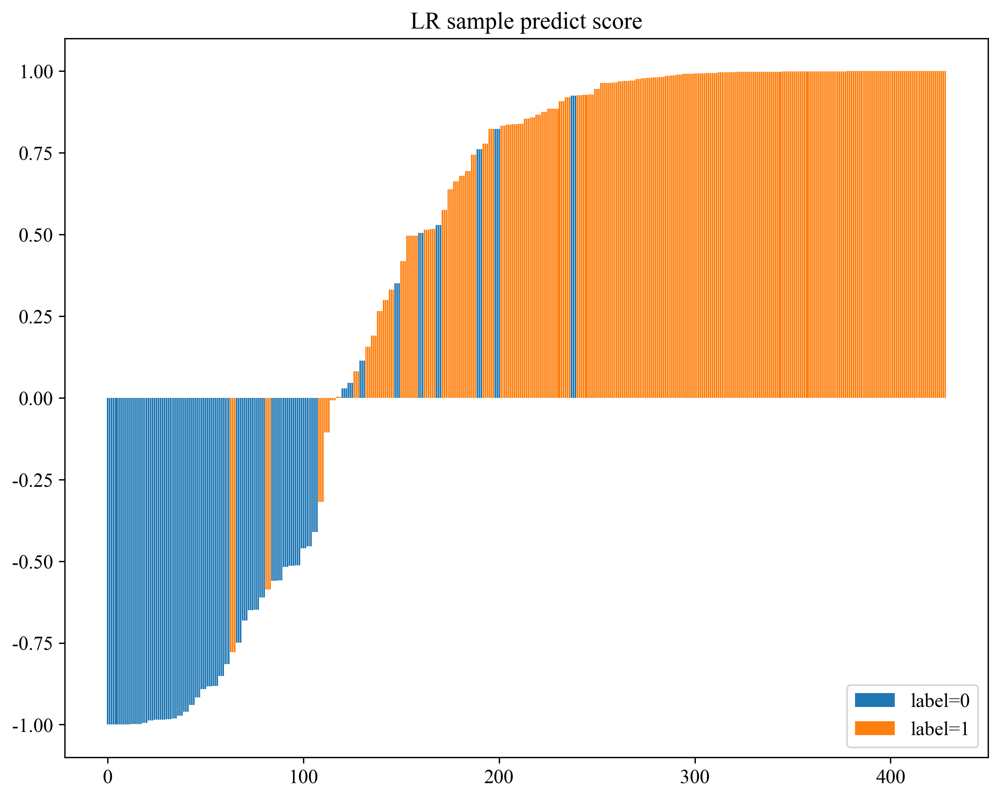

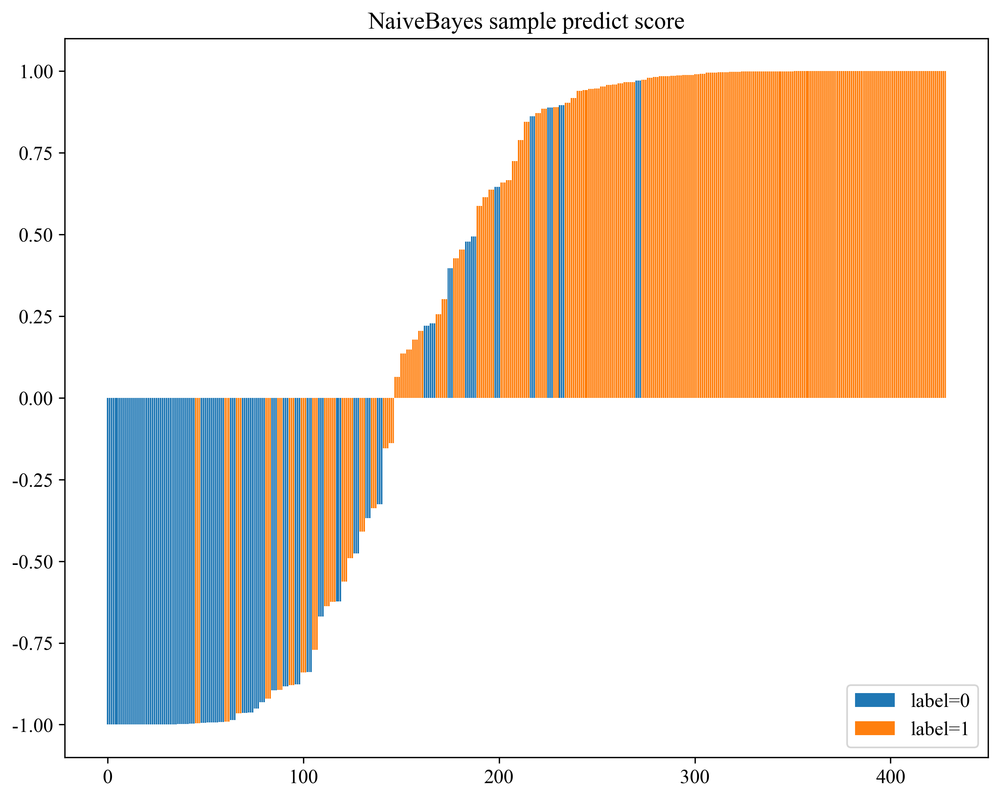

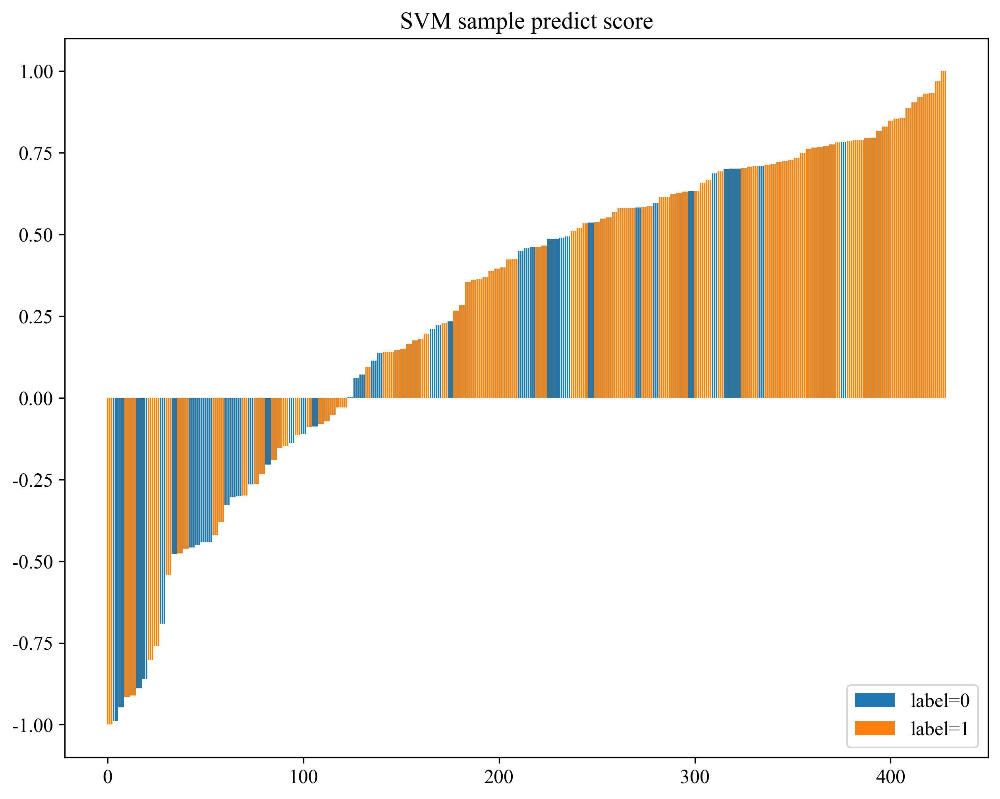

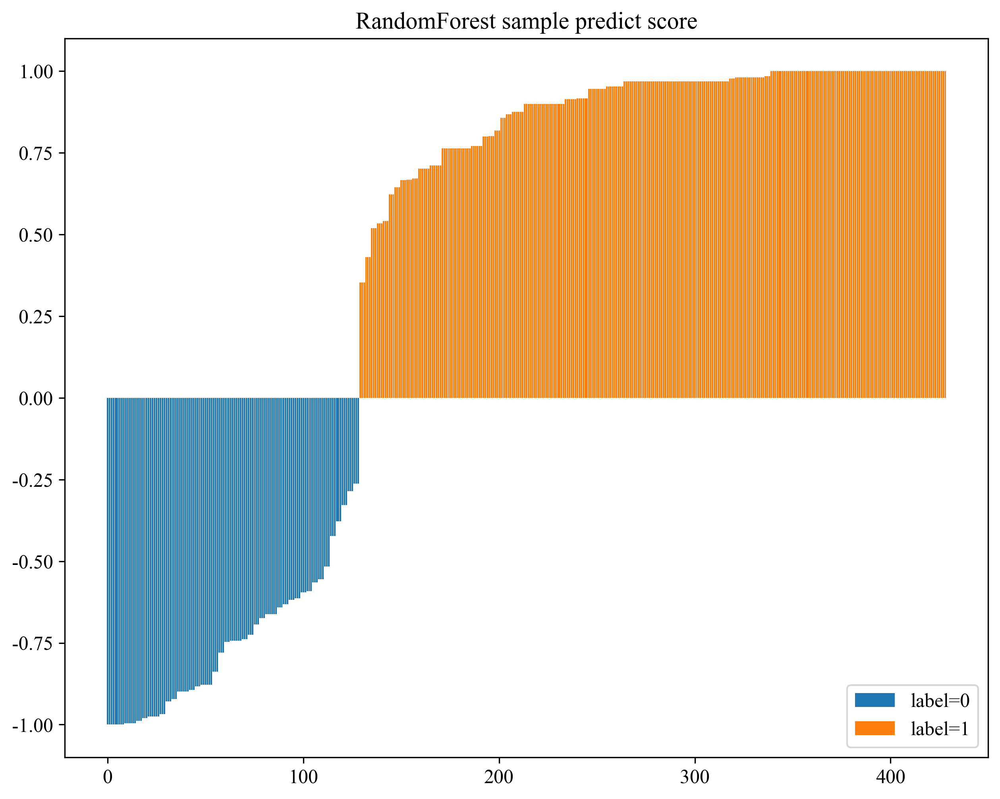

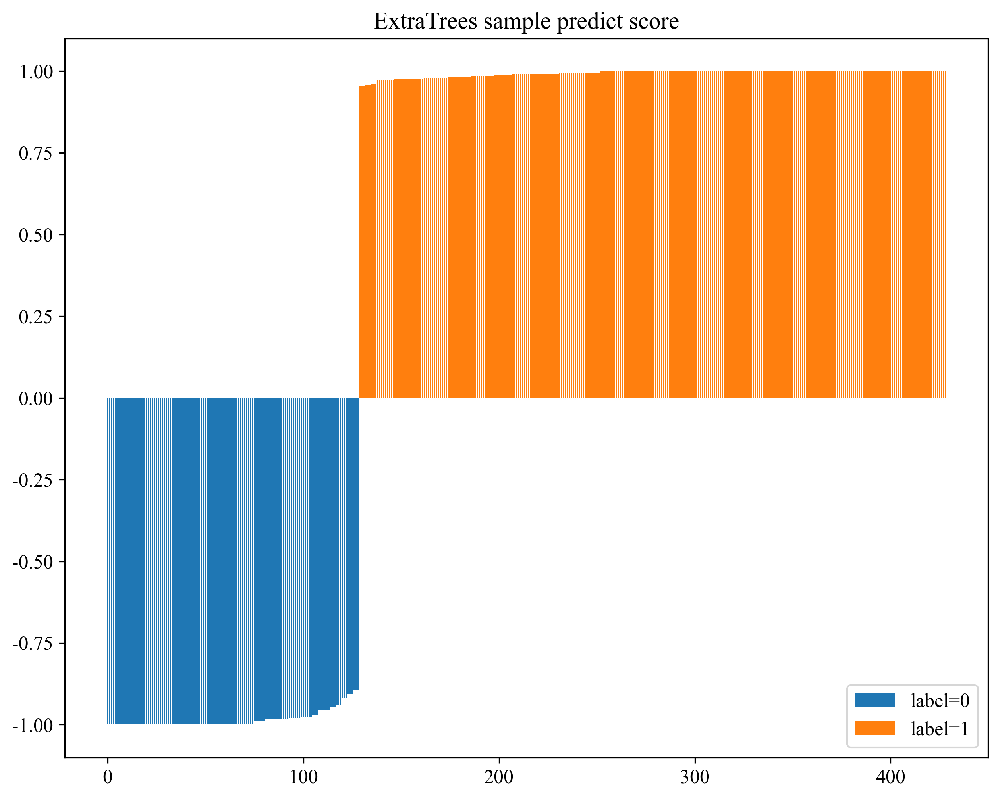

...

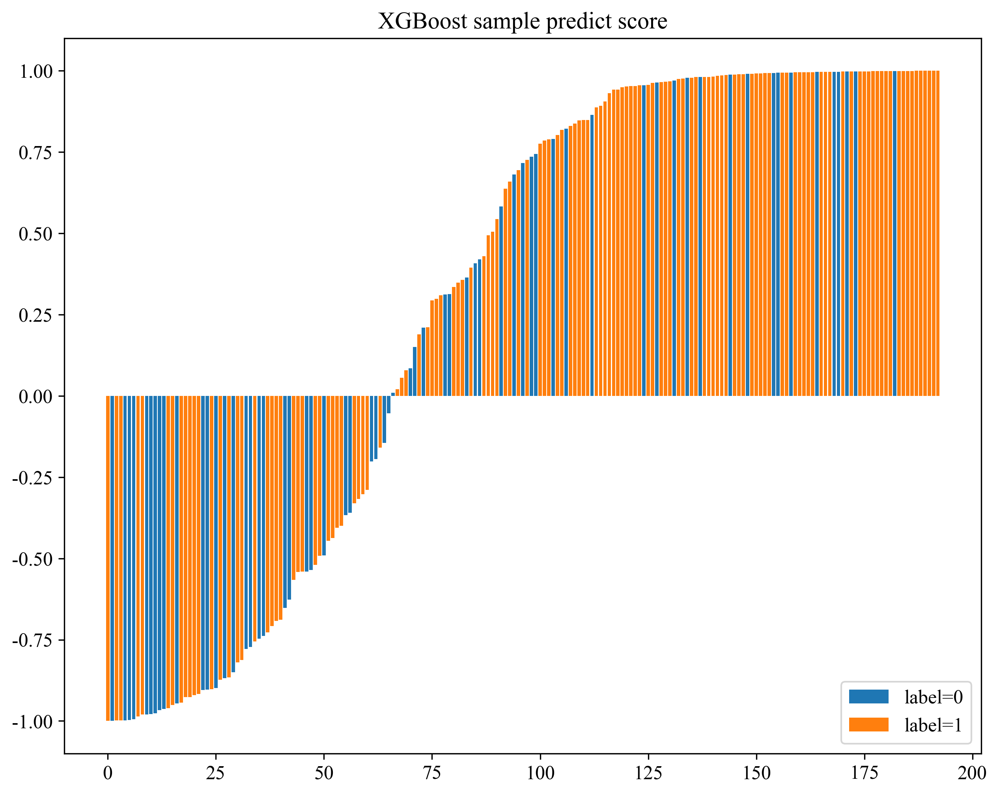

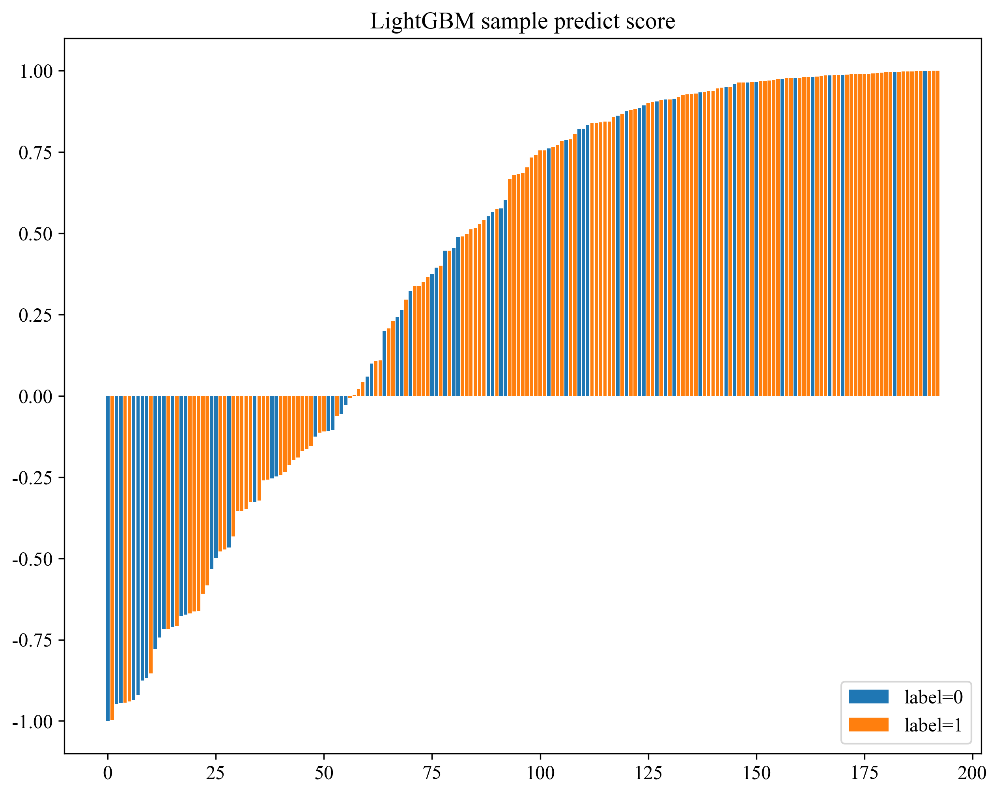

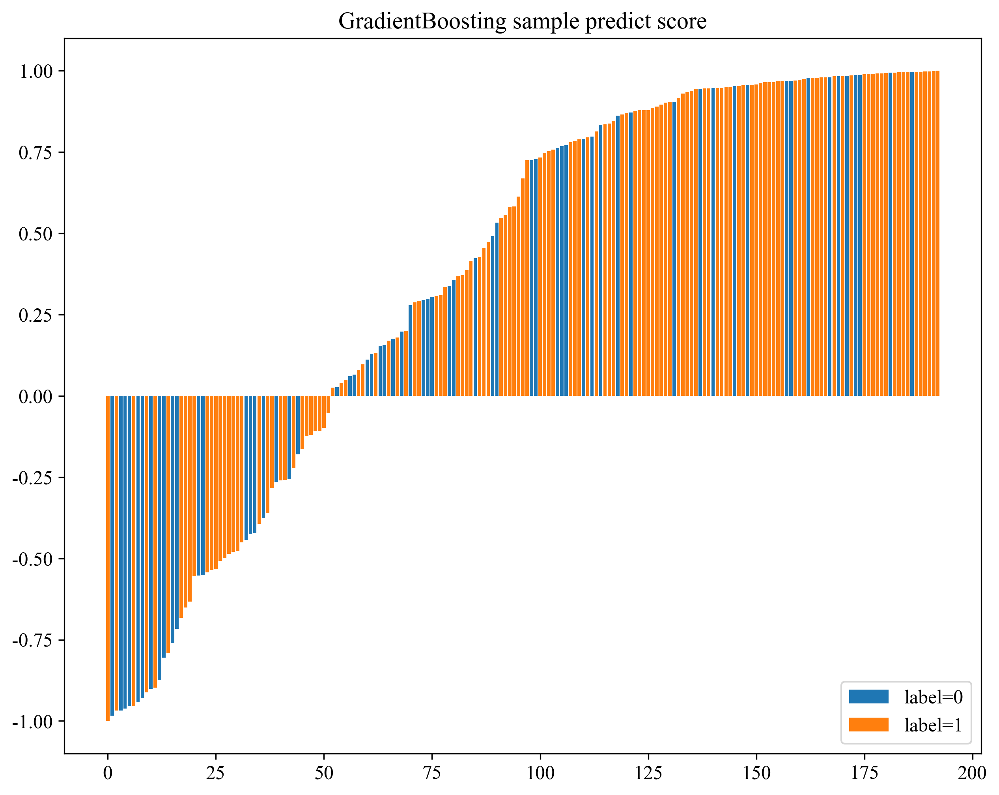

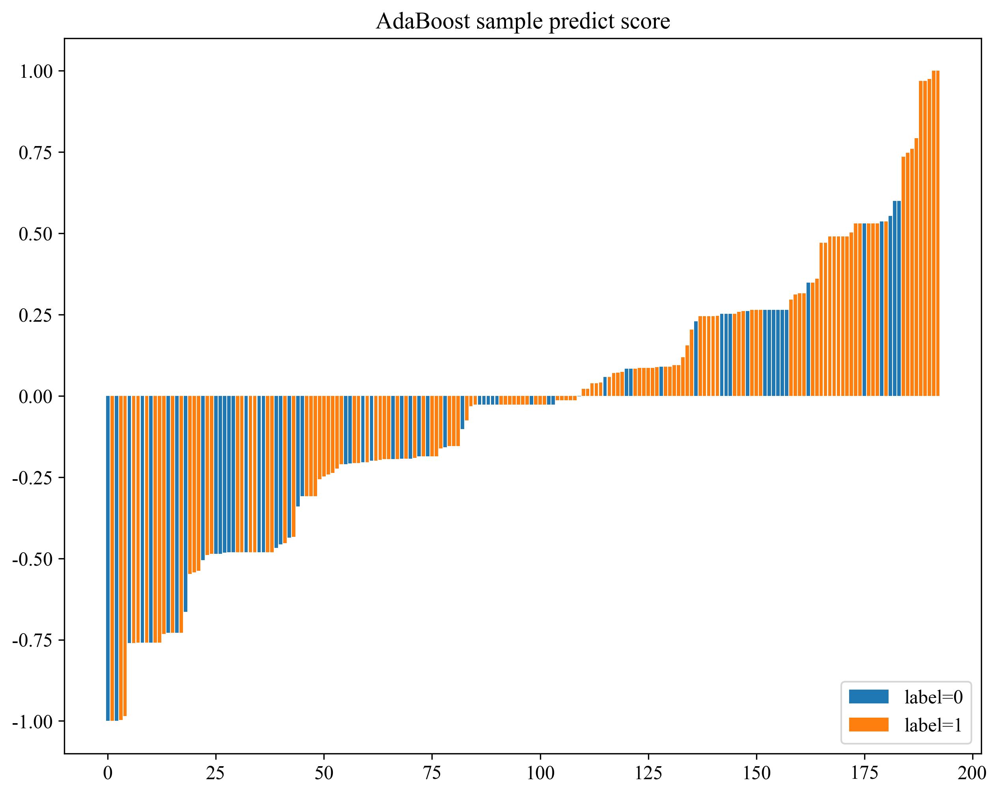

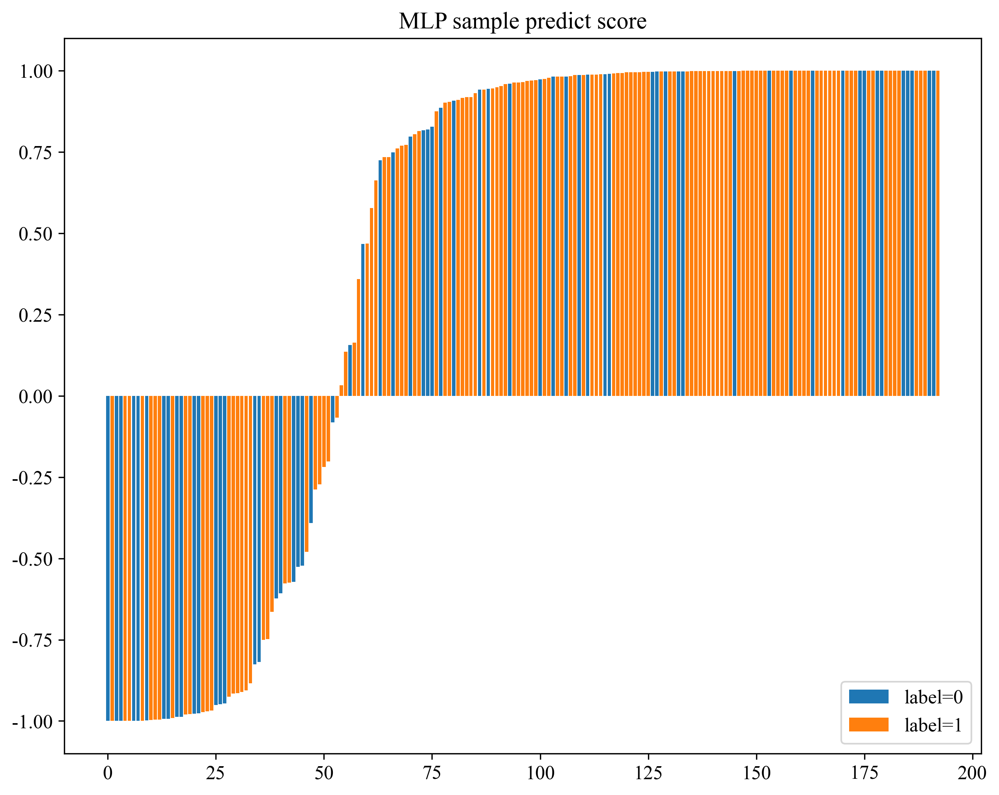

In [39]:
sel_model = model_names
c_matrix = {}

for sm in sel_model:
    if sm in model_names:
        sel_model_idx = model_names.index(sm)
        for idx, label in enumerate(labels):            
            okcomp.comp1.draw_predict_score(pred_scores[idx][sel_model_idx][0], y_train_sel[label])
            plt.title(f'{sm} sample predict score')
            plt.legend(labels=["label=0","label=1"],loc="lower right") 
            plt.savefig(f'img/{task_type}model_{sm}_sample_dis_train.svg', bbox_inches = 'tight')
            plt.show()

for sm in sel_model:
    if sm in model_names:
        sel_model_idx = model_names.index(sm)
        for idx, label in enumerate(labels):            
            okcomp.comp1.draw_predict_score(pred_scores[idx][sel_model_idx][-1], y_test_sel[label])
            plt.title(f'{sm} sample predict score')
            plt.legend(labels=["label=0","label=1"],loc="lower right") 
            plt.savefig(f'img/{task_type}model_{sm}_sample_dis_test.svg', bbox_inches = 'tight')
            plt.show()

## 保存模型结果

可以把模型预测的标签结果以及每个类别的概率都保存下来。

In [40]:
import os
import numpy as np

os.makedirs('results', exist_ok=True)
sel_model = sel_model

for idx, label in enumerate(labels):
    for sm in sel_model:
        if sm in model_names:
            sel_model_idx = model_names.index(sm)
            target = targets[idx][sel_model_idx]
            # 预测训练集和测试集数据。
            train_indexes = np.reshape(np.array(train_ids), (-1, 1)).astype(str)
            test_indexes = np.reshape(np.array(test_ids), (-1, 1)).astype(str)
            y_train_pred_scores = target.predict_proba(X_train_sel)
            y_test_pred_scores = target.predict_proba(X_test_sel)
            columns = ['ID'] + [f"{label}-{i}"for i in range(y_test_pred_scores.shape[1])]
            # 保存预测的训练集和测试集结果
            result_train = pd.DataFrame(np.concatenate([train_indexes, y_train_pred_scores], axis=1), columns=columns)
            result_train.to_csv(f'results/{task_type}{sm}_train.csv', index=False)
            result_test = pd.DataFrame(np.concatenate([test_indexes, y_test_pred_scores], axis=1), columns=columns)
            result_test.to_csv(f'results/{task_type}{sm}_test.csv', index=False)